# DH140 Final: Spatial Autocorrelation
by Pawan (Sine) Polcharoen

In this notebook, I will be conducting spatial autocorrelation analysis on eight song characteristics from both the June 2019 and May 2020 Spotify Top Songs data set, as well as the global GDP per capita values from 2019 and 2020.

In [1]:
# to read and wrangle data
import pandas as pd

import numpy as np

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


## Importing + Cleaning Data
### June 2019 Data
In this section, I will read in my June 2019 Spotify Top Songs dataset, group it by Country means, and subset the data frame to only include the columns I want to analyze.

In [2]:
june = pd.read_csv('data/spotify_june2019.csv')
june.head()

,Date,Position,Artist,Streams,Country,Date2,Title,danceability,energy,key,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,Unnamed..0,title
0,2019-06-07,1,Avicii,412907,Sweden,2019-06-07,Heaven,0.748,0.258,7,...,audio_features,7e9QE1vqclPjl0TEs2uxv6,spotify:track:7e9QE1vqclPjl0TEs2uxv6,https://api.spotify.com/v1/tracks/7e9QE1vqclPj...,https://api.spotify.com/v1/audio-analysis/7e9Q...,112927,4,Underground Rap,NaN,NaN
1,2019-06-07,1,Avicii,412907,Sweden,2019-06-07,Heaven,0.519,0.955,1,...,audio_features,1DmLlPEKT79nAXC8J1mXfC,spotify:track:1DmLlPEKT79nAXC8J1mXfC,https://api.spotify.com/v1/tracks/1DmLlPEKT79n...,https://api.spotify.com/v1/audio-analysis/1DmL...,215760,4,RnB,NaN,NaN
2,2019-06-08,1,Billie Eilish,245264,Australia,2019-06-08,bad guy,0.701,0.425,7,...,audio_features,2Fxmhks0bxGSBdJ92vM42m,spotify:track:2Fxmhks0bxGSBdJ92vM42m,https://api.spotify.com/v1/tracks/2Fxmhks0bxGS...,https://api.spotify.com/v1/audio-analysis/2Fxm...,194088,4,Pop,NaN,NaN
3,2019-06-02,1,Billie Eilish,4788,Latvia,2019-06-02,bad guy,0.701,0.425,7,...,audio_features,2Fxmhks0bxGSBdJ92vM42m,spotify:track:2Fxmhks0bxGSBdJ92vM42m,https://api.spotify.com/v1/tracks/2Fxmhks0bxGS...,https://api.spotify.com/v1/audio-analysis/2Fxm...,194088,4,Pop,NaN,NaN
4,2019-06-04,1,Billie Eilish,5681,Estonia,2019-06-04,bad guy,0.701,0.425,7,...,audio_features,2Fxmhks0bxGSBdJ92vM42m,spotify:track:2Fxmhks0bxGSBdJ92vM42m,https://api.spotify.com/v1/tracks/2Fxmhks0bxGS...,https://api.spotify.com/v1/audio-analysis/2Fxm...,194088,4,Pop,NaN,NaN


In [3]:
june_grouped=june.groupby(['Country']).mean()
june_grouped

,Position,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
Country,,,,,,,,,,,,,,,,,
Argentina,108.347305,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,0.173236,0.423542,153.893182,210477.132281,3.924333,NaN,NaN
Australia,104.043706,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,0.174632,0.430022,148.268357,208111.924089,3.983770,NaN,NaN
Austria,108.666562,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,0.170697,0.436742,149.481192,194825.786322,3.983612,NaN,NaN
Belgium,108.058648,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,0.178089,0.412002,144.968920,201599.504600,3.982291,NaN,NaN
Bolivia,123.185185,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,0.153766,0.433640,152.578966,213057.065394,3.928819,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Turkey,120.408032,27962.569478,0.709390,0.594614,5.248193,-6.108369,0.551004,0.112187,0.240199,0.090026,0.154732,0.437615,139.133524,202374.293173,4.000000,NaN,NaN
United Kingdom,103.863346,97813.604406,0.690146,0.604343,5.394157,-6.810981,0.594987,0.146558,0.211339,0.036277,0.170771,0.427813,147.018061,203086.611750,4.006066,NaN,NaN
United States,95.473948,394824.239965,0.735773,0.594864,5.377896,-6.775312,0.593821,0.161231,0.201604,0.019085,0.176275,0.448334,144.710638,194962.232351,4.000218,NaN,NaN


In [4]:
june_flat = june_grouped.reset_index()
june_flat

,Country,Position,Streams,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
0,Argentina,108.347305,40676.207948,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,0.173236,0.423542,153.893182,210477.132281,3.924333,NaN,NaN
1,Australia,104.043706,51633.417764,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,0.174632,0.430022,148.268357,208111.924089,3.983770,NaN,NaN
2,Austria,108.666562,7997.103057,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,0.170697,0.436742,149.481192,194825.786322,3.983612,NaN,NaN
3,Belgium,108.058648,11039.809108,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,0.178089,0.412002,144.968920,201599.504600,3.982291,NaN,NaN
4,Bolivia,123.185185,2436.722801,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,0.153766,0.433640,152.578966,213057.065394,3.928819,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,Turkey,120.408032,27962.569478,0.709390,0.594614,5.248193,-6.108369,0.551004,0.112187,0.240199,0.090026,0.154732,0.437615,139.133524,202374.293173,4.000000,NaN,NaN
58,United Kingdom,103.863346,97813.604406,0.690146,0.604343,5.394157,-6.810981,0.594987,0.146558,0.211339,0.036277,0.170771,0.427813,147.018061,203086.611750,4.006066,NaN,NaN
59,United States,95.473948,394824.239965,0.735773,0.594864,5.377896,-6.775312,0.593821,0.161231,0.201604,0.019085,0.176275,0.448334,144.710638,194962.232351,4.000218,NaN,NaN
60,Uruguay,107.720392,2933.776454,0.663212,0.577698,4.733006,-7.129076,0.655221,0.105867,0.240506,0.079046,0.161915,0.414345,154.588296,214938.381219,3.911002,NaN,NaN


In [5]:
# remove 'Global' row
june_flat = june_flat[june_flat.Country != 'Global']
june_flat.shape

(61, 18)

In [24]:
## subset it
columns_to_keep = ['Country',                  
 'danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence']
june_flat = june_flat[columns_to_keep]
june_flat

,Country,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence
0,Argentina,0.676707,0.579919,4.786064,-7.163733,0.674469,0.109480,0.257105,0.067553,0.173236,0.423542
1,Australia,0.698594,0.600252,4.931246,-6.718895,0.620831,0.132742,0.239568,0.040624,0.174632,0.430022
2,Austria,0.699453,0.609601,5.840214,-6.651115,0.591869,0.132898,0.241716,0.064974,0.170697,0.436742
3,Belgium,0.691866,0.590516,5.348896,-6.598304,0.577967,0.131102,0.260051,0.056351,0.178089,0.412002
4,Bolivia,0.659860,0.576069,4.232060,-7.073698,0.625000,0.105108,0.253995,0.062562,0.153766,0.433640
...,...,...,...,...,...,...,...,...,...,...,...
57,Turkey,0.709390,0.594614,5.248193,-6.108369,0.551004,0.112187,0.240199,0.090026,0.154732,0.437615
58,United Kingdom,0.690146,0.604343,5.394157,-6.810981,0.594987,0.146558,0.211339,0.036277,0.170771,0.427813
59,United States,0.735773,0.594864,5.377896,-6.775312,0.593821,0.161231,0.201604,0.019085,0.176275,0.448334
60,Uruguay,0.663212,0.577698,4.733006,-7.129076,0.655221,0.105867,0.240506,0.079046,0.161915,0.414345


In [26]:
june_flat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 61 entries, 0 to 61
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Country           61 non-null     object 
 1   danceability      61 non-null     float64
 2   energy            61 non-null     float64
 3   key               61 non-null     float64
 4   loudness          61 non-null     float64
 5   mode              61 non-null     float64
 6   speechiness       61 non-null     float64
 7   acousticness      61 non-null     float64
 8   instrumentalness  61 non-null     float64
 9   liveness          61 non-null     float64
 10  valence           61 non-null     float64
dtypes: float64(10), object(1)
memory usage: 5.7+ KB


### May 2020 Data
In this section, I will read in the May 2020 Spotify Top Songs dataset, group it by Country means, and subset the data frame to only include the columns I want to analyze.

In [27]:
may = pd.read_csv('data/spotify_may2020.csv')
may.head()

,Country,Continent,Rank,Title,Artists,Album,Explicit,Duration,danceability,energy,...,type,id,uri,track_href,analysis_url,duration_ms,time_signature,genre,Unnamed..0,title
0,Global,Global,1,Rain On Me (with Ariana Grande),"Lady Gaga, Ariana Grande",Rain On Me (with Ariana Grande),0,3:02,0.672,0.855,...,audio_features,24ySl2hOPGCDcxBxFIqWBu,spotify:track:24ySl2hOPGCDcxBxFIqWBu,https://api.spotify.com/v1/tracks/24ySl2hOPGCD...,https://api.spotify.com/v1/audio-analysis/24yS...,182200,4,Pop,NaN,NaN
1,Global,Global,2,Blinding Lights,The Weeknd,After Hours,0,3:20,0.518,0.727,...,audio_features,5Sg09MvHqNWPWsYeuY2toY,spotify:track:5Sg09MvHqNWPWsYeuY2toY,https://api.spotify.com/v1/tracks/5Sg09MvHqNWP...,https://api.spotify.com/v1/audio-analysis/5Sg0...,200046,4,RnB,NaN,NaN
2,Global,Global,2,Blinding Lights,The Weeknd,After Hours,0,3:20,0.513,0.796,...,audio_features,0sf12qNH5qcw8qpgymFOqD,spotify:track:0sf12qNH5qcw8qpgymFOqD,https://api.spotify.com/v1/tracks/0sf12qNH5qcw...,https://api.spotify.com/v1/audio-analysis/0sf1...,201573,4,Pop,NaN,NaN
3,Global,Global,3,ROCKSTAR (feat. Roddy Ricch),"DaBaby, Roddy Ricch",BLAME IT ON BABY,1,3:01,0.746,0.690,...,audio_features,7ytR5pFWmSjzHJIeQkgog4,spotify:track:7ytR5pFWmSjzHJIeQkgog4,https://api.spotify.com/v1/tracks/7ytR5pFWmSjz...,https://api.spotify.com/v1/audio-analysis/7ytR...,181733,4,Underground Rap,NaN,NaN
4,Global,Global,3,ROCKSTAR (feat. Roddy Ricch),"DaBaby, Roddy Ricch",BLAME IT ON BABY,1,3:01,0.746,0.690,...,audio_features,7ytR5pFWmSjzHJIeQkgog4,spotify:track:7ytR5pFWmSjzHJIeQkgog4,https://api.spotify.com/v1/tracks/7ytR5pFWmSjz...,https://api.spotify.com/v1/audio-analysis/7ytR...,181733,4,Rap,NaN,NaN


In [28]:
may_grouped=may.groupby(['Country']).mean()
may_grouped.head()

,Rank,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
Country,,,,,,,,,,,,,,,,,
Argentina,29.352941,0.117647,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,0.501647,148.348294,218284.647059,4.000000,NaN,NaN
Australia,26.620253,0.493671,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,0.480185,141.490722,199662.594937,4.000000,NaN,NaN
Austria,30.109091,0.563636,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,0.486540,141.993200,200044.618182,3.963636,NaN,NaN
Belgium,24.028986,0.536232,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,0.464981,141.238333,195437.521739,4.000000,NaN,NaN
Bolivia,19.300000,0.200000,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,0.562100,163.734500,203220.500000,4.000000,NaN,NaN


In [29]:
may_flat = may_grouped.reset_index()
may_flat

,Country,Rank,Explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,Unnamed..0,title
0,Argentina,29.352941,0.117647,0.693941,0.659353,3.941176,-6.295824,0.647059,0.146606,0.172241,0.000712,0.141424,0.501647,148.348294,218284.647059,4.000000,NaN,NaN
1,Australia,26.620253,0.493671,0.692203,0.628671,5.341772,-6.683797,0.531646,0.108065,0.198552,0.044756,0.202782,0.480185,141.490722,199662.594937,4.000000,NaN,NaN
2,Austria,30.109091,0.563636,0.727636,0.626455,6.600000,-6.766836,0.454545,0.127291,0.167883,0.030190,0.215382,0.486540,141.993200,200044.618182,3.963636,NaN,NaN
3,Belgium,24.028986,0.536232,0.710246,0.593783,5.956522,-6.911913,0.478261,0.109658,0.224307,0.033749,0.198519,0.464981,141.238333,195437.521739,4.000000,NaN,NaN
4,Bolivia,19.300000,0.200000,0.687700,0.727100,4.300000,-4.870500,0.800000,0.082850,0.216520,0.001139,0.148220,0.562100,163.734500,203220.500000,4.000000,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58,Turkey,38.666667,0.333333,0.702857,0.643905,6.714286,-7.029810,0.238095,0.079190,0.180024,0.072848,0.294910,0.407914,132.072476,189914.428571,4.000000,NaN,NaN
59,United Kingdom,21.081967,0.557377,0.706443,0.611115,5.622951,-6.839262,0.508197,0.117756,0.222518,0.039327,0.193792,0.496451,146.820197,197804.098361,3.967213,NaN,NaN
60,United States,24.117647,0.725490,0.744755,0.616529,5.980392,-6.700529,0.509804,0.122403,0.162215,0.021629,0.208085,0.455284,141.385892,197009.960784,3.970588,NaN,NaN
61,Uruguay,28.818182,0.181818,0.663182,0.694273,3.909091,-5.211909,0.818182,0.080200,0.245018,0.087036,0.142000,0.523636,160.197545,204993.181818,4.000000,NaN,NaN


In [30]:
# remove 'Global' row
may_flat = may_flat[may_flat.Country != 'Global']
may_flat.shape

(62, 18)

In [31]:
## subset it
columns_to_keep = ['Country',                   
 'danceability',
 'energy',
 'loudness',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence']
may_flat = may_flat[columns_to_keep]
may_flat

,Country,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence
0,Argentina,0.693941,0.659353,-6.295824,0.146606,0.172241,0.000712,0.141424,0.501647
1,Australia,0.692203,0.628671,-6.683797,0.108065,0.198552,0.044756,0.202782,0.480185
2,Austria,0.727636,0.626455,-6.766836,0.127291,0.167883,0.030190,0.215382,0.486540
3,Belgium,0.710246,0.593783,-6.911913,0.109658,0.224307,0.033749,0.198519,0.464981
4,Bolivia,0.687700,0.727100,-4.870500,0.082850,0.216520,0.001139,0.148220,0.562100
...,...,...,...,...,...,...,...,...,...
58,Turkey,0.702857,0.643905,-7.029810,0.079190,0.180024,0.072848,0.294910,0.407914
59,United Kingdom,0.706443,0.611115,-6.839262,0.117756,0.222518,0.039327,0.193792,0.496451
60,United States,0.744755,0.616529,-6.700529,0.122403,0.162215,0.021629,0.208085,0.455284
61,Uruguay,0.663182,0.694273,-5.211909,0.080200,0.245018,0.087036,0.142000,0.523636


### World + GDP per capita Data
In this section, I will read in the world .geojson file and the GDP per capita dataset, rename the columns, and subset the data frame to only include the columns I want to analyze. For the GDP dataset, I will also be converting the GPD columns from objects to floats for numerical analysis.

In [13]:
world = gpd.read_file('data/world.geojson')

# current columns as a list
world.columns.to_list()

# rename
world.columns = ['FID', 'Country', 'ISO', 'COUNTRYAFF', 'AFF_ISO', 'geometry']
world.head(6)

,FID,Country,ISO,COUNTRYAFF,AFF_ISO,geometry
0,1,American Samoa,AS,United States,US,"POLYGON ((-170.74390 -14.37555, -170.74942 -14..."
1,2,United States Minor Outlying Islands,UM,United States,US,"MULTIPOLYGON (((-160.02114 -0.39805, -160.0281..."
2,3,Cook Islands,CK,New Zealand,NZ,"MULTIPOLYGON (((-159.74698 -21.25667, -159.793..."
3,4,French Polynesia,PF,France,FR,"MULTIPOLYGON (((-149.17920 -17.87084, -149.258..."
4,5,Niue,NU,New Zealand,NZ,"POLYGON ((-169.89389 -19.14556, -169.93088 -19..."
5,6,Pitcairn,PN,United Kingdom,GB,"MULTIPOLYGON (((-128.33222 -24.32726, -128.326..."


In [14]:
gdp = pd.read_csv('data/GDPpercap.csv')

# current columns as a list
gdp.columns.to_list()

# rename
gdp.columns = ['WEO Country Code', 'ISO', 'Country', 'GDP2019', 'GDP2020']
gdp.head()

,WEO Country Code,ISO,Country,GDP2019,GDP2020
0,512,AFG,Afghanistan,507.29,499.441
1,914,ALB,Albania,"5,323.19","4,898.28"
2,612,DZA,Algeria,"3,898.01","3,331.08"
3,614,AGO,Angola,"2,967.96","2,021.31"
4,311,ATG,Antigua and Barbuda,"17,195.46","14,158.57"


In [15]:
gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   WEO Country Code  194 non-null    object
 1   ISO               193 non-null    object
 2   Country           193 non-null    object
 3   GDP2019           193 non-null    object
 4   GDP2020           192 non-null    object
dtypes: object(5)
memory usage: 7.7+ KB


In [16]:
gdp['GDP2019'] = gdp['GDP2019'].str.replace(',','').astype(np.float64)
gdp['GDP2020'] = gdp['GDP2020'].str.replace(',','').astype(np.float64)
gdp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195 entries, 0 to 194
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   WEO Country Code  194 non-null    object 
 1   ISO               193 non-null    object 
 2   Country           193 non-null    object 
 3   GDP2019           193 non-null    float64
 4   GDP2020           192 non-null    float64
dtypes: float64(2), object(3)
memory usage: 7.7+ KB


## Merging Data
In this section, I will be creating three new data frames by merging the Spotify datasets and GDP per capita dataset with the geometry coordinates. After merging, I will drop all NA rows and convert the new dataset into a Geo Data Frame. This process will allow for me to map and spatially visualize the data.

In [32]:
gdf = pd.merge(gdp,world,on='Country')
gdf = gdf.dropna(how='any',axis=0) 
gdf = gpd.GeoDataFrame(gdf)
gdf.head(10)

,WEO Country Code,ISO_x,Country,GDP2019,GDP2020,FID,ISO_y,COUNTRYAFF,AFF_ISO,geometry
0,512,AFG,Afghanistan,507.29,499.441,192,AF,Afghanistan,AF,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,914,ALB,Albania,5323.19,4898.280,164,AL,Albania,AL,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,612,DZA,Algeria,3898.01,3331.080,125,DZ,Algeria,DZ,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,614,AGO,Angola,2967.96,2021.310,96,AO,Angola,AO,"MULTIPOLYGON (((23.47611 -17.62584, 23.28916 -..."
4,311,ATG,Antigua and Barbuda,17195.46,14158.570,29,AG,Antigua and Barbuda,AG,"MULTIPOLYGON (((-61.73806 16.98972, -61.82917 ..."
5,213,ARG,Argentina,9890.31,8433.040,15,AR,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
6,911,ARM,Armenia,4604.77,4314.730,209,AM,Armenia,AM,"MULTIPOLYGON (((46.54037 38.87559, 46.51639 38..."
7,314,ABW,Aruba,25744.56,20310.100,30,AW,Aruba,AW,"POLYGON ((-69.88224 12.41111, -69.94695 12.436..."
8,193,AUS,Australia,54348.23,51885.470,218,AU,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
9,122,AUT,Austria,50380.28,48634.340,165,AT,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."


In [35]:
jdf = pd.merge(june_flat,world,on='Country')
jdf = jdf.dropna(how='any',axis=0) 
jdf = gpd.GeoDataFrame(jdf)
mdf.head(10)

,Country,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,FID,ISO,COUNTRYAFF,AFF_ISO,geometry
0,Argentina,0.693941,0.659353,-6.295824,0.146606,0.172241,0.000712,0.141424,0.501647,15,AR,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.692203,0.628671,-6.683797,0.108065,0.198552,0.044756,0.202782,0.480185,218,AU,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.727636,0.626455,-6.766836,0.127291,0.167883,0.030190,0.215382,0.486540,165,AT,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.710246,0.593783,-6.911913,0.109658,0.224307,0.033749,0.198519,0.464981,160,BE,Belgium,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.687700,0.727100,-4.870500,0.082850,0.216520,0.001139,0.148220,0.562100,20,BO,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."
5,Brazil,0.721111,0.680556,-5.902889,0.097900,0.172244,0.001248,0.188911,0.621000,21,BR,Brazil,BR,"MULTIPOLYGON (((-44.69501 -1.81778, -44.64001 ..."
6,Bulgaria,0.727946,0.625351,-6.736257,0.137872,0.154195,0.040260,0.229649,0.500631,183,BG,Bulgaria,BG,"POLYGON ((22.93560 41.34213, 22.95590 41.35562..."
7,Canada,0.721515,0.612371,-6.680742,0.116015,0.205720,0.036540,0.188881,0.454052,14,CA,Canada,CA,"MULTIPOLYGON (((-87.03528 65.47915, -87.06368 ..."
8,Chile,0.669727,0.729364,-5.229182,0.083518,0.223510,0.000065,0.117109,0.535727,17,CL,Chile,CL,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640..."
9,Colombia,0.678556,0.727444,-4.802333,0.086556,0.238722,0.000077,0.125467,0.524778,38,CO,Colombia,CO,"MULTIPOLYGON (((-74.86081 11.12549, -74.83459 ..."


In [34]:
mdf = pd.merge(may_flat,world,on='Country')
mdf = mdf.dropna(how='any',axis=0) 
mdf = gpd.GeoDataFrame(mdf)
mdf.head(10)

,Country,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,FID,ISO,COUNTRYAFF,AFF_ISO,geometry
0,Argentina,0.693941,0.659353,-6.295824,0.146606,0.172241,0.000712,0.141424,0.501647,15,AR,Argentina,AR,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.692203,0.628671,-6.683797,0.108065,0.198552,0.044756,0.202782,0.480185,218,AU,Australia,AU,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.727636,0.626455,-6.766836,0.127291,0.167883,0.030190,0.215382,0.486540,165,AT,Austria,AT,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.710246,0.593783,-6.911913,0.109658,0.224307,0.033749,0.198519,0.464981,160,BE,Belgium,BE,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.687700,0.727100,-4.870500,0.082850,0.216520,0.001139,0.148220,0.562100,20,BO,Bolivia,BO,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."
5,Brazil,0.721111,0.680556,-5.902889,0.097900,0.172244,0.001248,0.188911,0.621000,21,BR,Brazil,BR,"MULTIPOLYGON (((-44.69501 -1.81778, -44.64001 ..."
6,Bulgaria,0.727946,0.625351,-6.736257,0.137872,0.154195,0.040260,0.229649,0.500631,183,BG,Bulgaria,BG,"POLYGON ((22.93560 41.34213, 22.95590 41.35562..."
7,Canada,0.721515,0.612371,-6.680742,0.116015,0.205720,0.036540,0.188881,0.454052,14,CA,Canada,CA,"MULTIPOLYGON (((-87.03528 65.47915, -87.06368 ..."
8,Chile,0.669727,0.729364,-5.229182,0.083518,0.223510,0.000065,0.117109,0.535727,17,CL,Chile,CL,"MULTIPOLYGON (((-73.04210 -43.73384, -73.04640..."
9,Colombia,0.678556,0.727444,-4.802333,0.086556,0.238722,0.000077,0.125467,0.524778,38,CO,Colombia,CO,"MULTIPOLYGON (((-74.86081 11.12549, -74.83459 ..."


# June 2019 Song Characteristic Analysis
In this section, I will be spatial autocorrelation analysis on eight song characteristics from June 2019. 
## Spatial Autocorrelation Analysis: Danceability 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [282]:
sdf = jdf[['Country','danceability','geometry']]
sdf.head()

,Country,danceability,geometry
0,Argentina,0.676707,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.698594,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.699453,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.691866,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.659860,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [283]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [284]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [285]:
# create a new column for the spatial lag
sdf['danceability_lag'] = lps.weights.lag_spatial(wq, sdf['danceability'])

In [286]:
sdf.sample(10)

,Country,danceability,geometry,danceability_lag
15,El Salvador,0.672805,"POLYGON ((-9762126.333 1553460.070, -9765503.3...",0.667222
36,Netherlands,0.665484,"MULTIPOLYGON (((419024.739 6682597.303, 430203...",0.692333
5,Brazil,0.699637,"MULTIPOLYGON (((-4975425.634 -202388.509, -496...",0.675096
46,Romania,0.718667,"POLYGON ((2707257.640 5418615.317, 2705929.939...",0.699647
18,France,0.670040,"MULTIPOLYGON (((198339.953 5246743.398, 193541...",0.689952
42,Peru,0.681206,"POLYGON ((-7736674.195 -1979723.033, -7751177....",0.671013
21,Guatemala,0.666297,"POLYGON ((-9946208.251 1623823.844, -9955921.4...",0.672041
2,Austria,0.699453,"POLYGON ((1165652.677 5921100.999, 1167542.104...",0.691028
26,Indonesia,0.659184,"MULTIPOLYGON (((12206022.235 230861.234, 12204...",0.673505
14,Ecuador,0.668504,"MULTIPOLYGON (((-8844519.773 -531205.260, -885...",0.670747


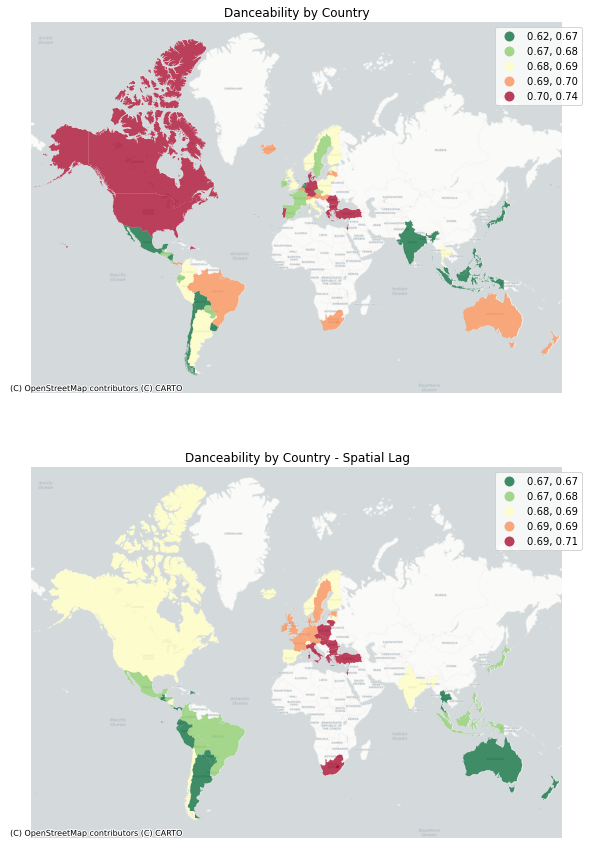

In [287]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='danceability', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Danceability by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='danceability_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Danceability by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [26]:
y = sdf.danceability
moran = Moran(y, wq)
moran.I

0.17591610340075853

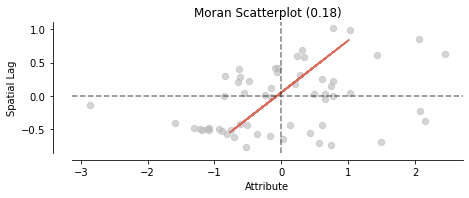

In [27]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43bb37e070>)

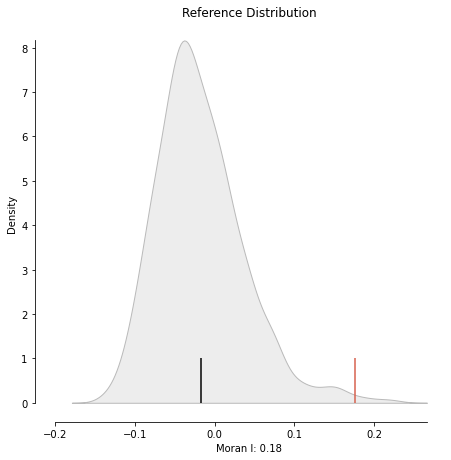

In [28]:
plot_moran_simulation(moran,aspect_equal=False)

In [29]:
moran.p_sim

0.007

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high danceability near other high danceability neighbors
- LL: low danceability geographies near other low danceability neighbors
- LH (donuts): low danceability geographies surrounded by high danceability neighbors
- HL (diamonds): high danceability geographies surrounded by low danceability neighbors

In [30]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

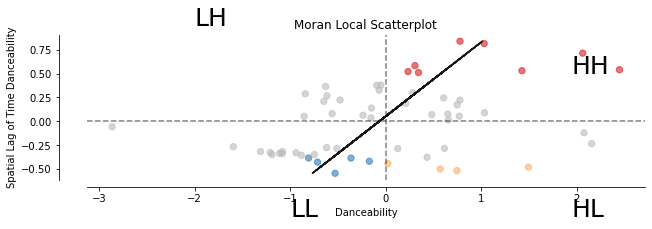

In [31]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Danceability")
ax.set_ylabel('Spatial Lag of Time Danceability')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

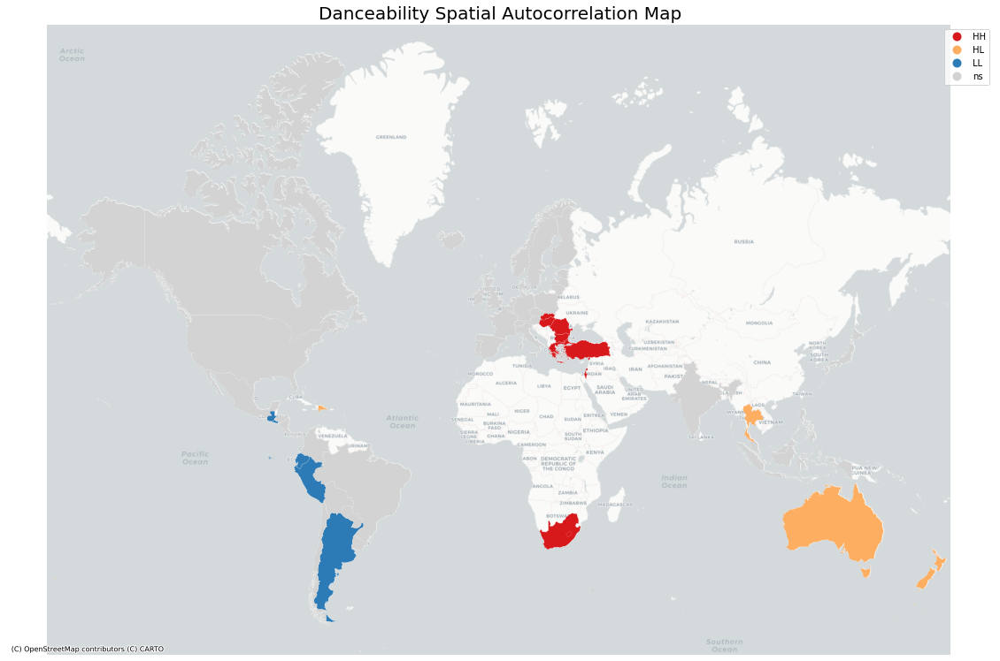

In [32]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Danceability Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

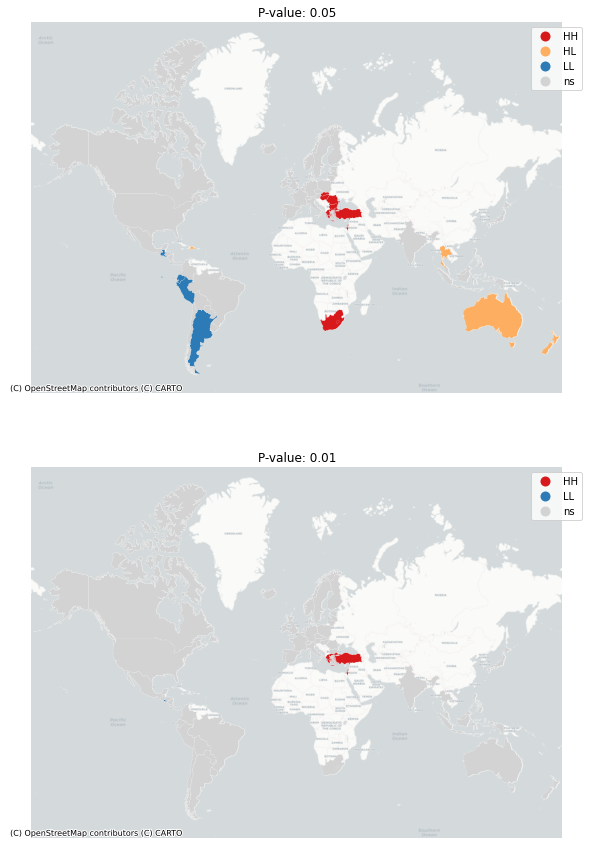

In [33]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Energy 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [34]:
sdf = jdf[['Country','energy','geometry']]
sdf.head()

,Country,energy,geometry
0,Argentina,0.579919,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.600252,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.609601,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.590516,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.576069,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [35]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [36]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

NameError: name 'sdf' is not defined

In [37]:
# create a new column for the spatial lag
sdf['energy_lag'] = lps.weights.lag_spatial(wq, sdf['energy'])

In [38]:
sdf.sample(10)

,Country,energy,geometry,energy_lag
27,Ireland,0.603742,"MULTIPOLYGON (((-1002039.385 7009973.877, -100...",0.598682
16,Estonia,0.585971,"MULTIPOLYGON (((3118707.621 8284557.732, 31198...",0.603404
5,Brazil,0.557919,"MULTIPOLYGON (((-4975425.634 -202388.509, -496...",0.587920
53,Thailand,0.580445,"MULTIPOLYGON (((11321141.584 642391.919, 11320...",0.603191
45,Portugal,0.592300,"MULTIPOLYGON (((-962417.777 5015082.916, -9637...",0.593777
57,Uruguay,0.577698,"POLYGON ((-6499821.611 -3951518.978, -6502829....",0.584074
12,Denmark,0.605764,"MULTIPOLYGON (((1069810.720 7438797.541, 10683...",0.601232
51,Sweden,0.592778,"MULTIPOLYGON (((1924373.918 8236588.364, 19249...",0.601998
39,Norway,0.595864,"MULTIPOLYGON (((1168330.473 9458211.247, 11710...",0.600506
21,Guatemala,0.588847,"POLYGON ((-9946208.251 1623823.844, -9955921.4...",0.581818


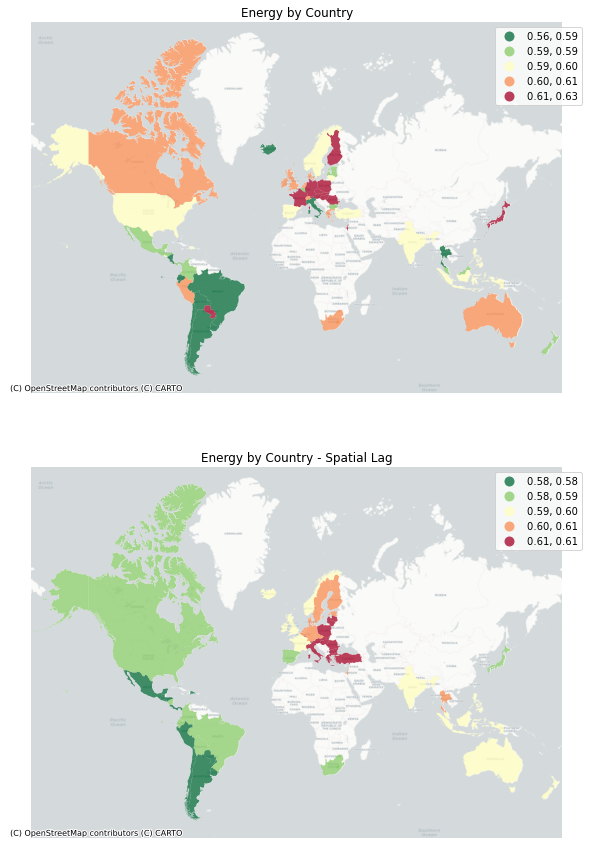

In [39]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='energy', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Energy by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='energy_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Energy by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [40]:
y = sdf.energy
moran = Moran(y, wq)
moran.I

0.22024629596151035

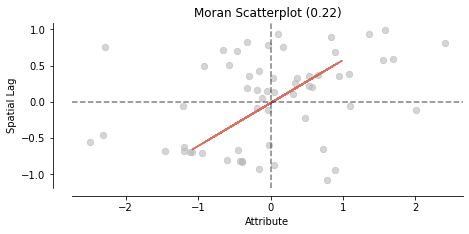

In [41]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b83ef760>)

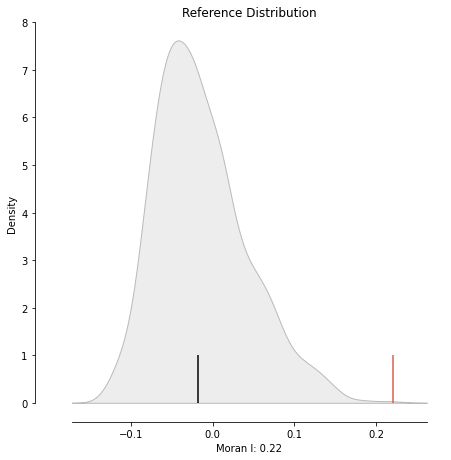

In [42]:
plot_moran_simulation(moran,aspect_equal=False)

In [43]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high energy near other high energy neighbors
- LL: low energy geographies near other low energy neighbors
- LH (donuts): low energy geographies surrounded by high energy neighbors
- HL (diamonds): high energy geographies surrounded by low energy neighbors

In [44]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

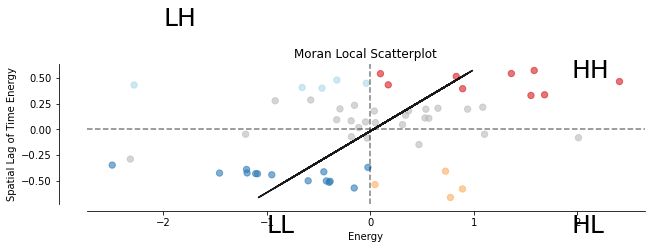

In [45]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Energy")
ax.set_ylabel('Spatial Lag of Time Energy')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

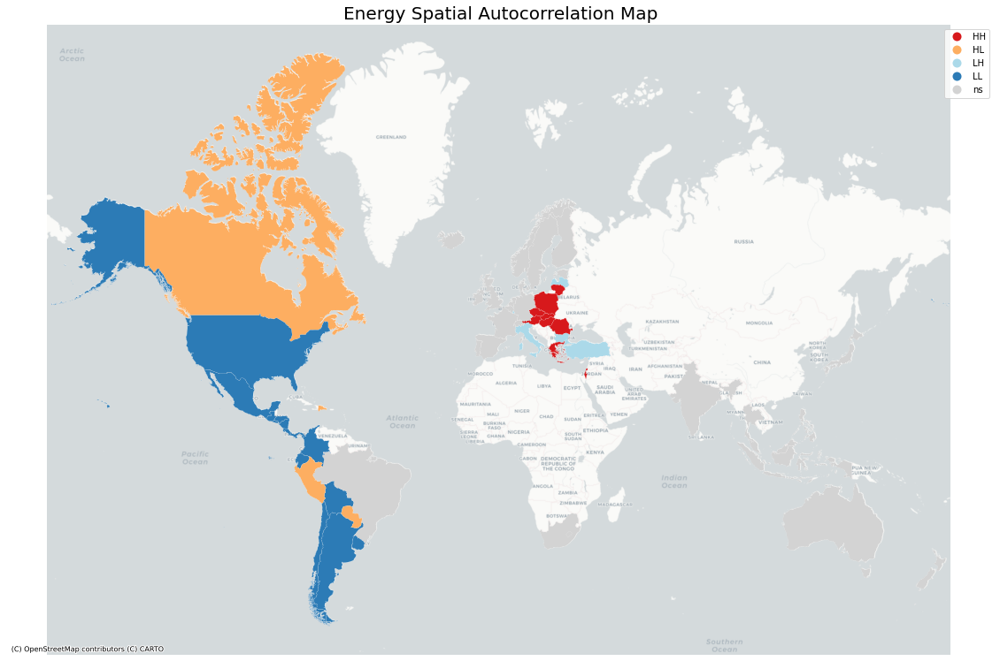

In [46]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Energy Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

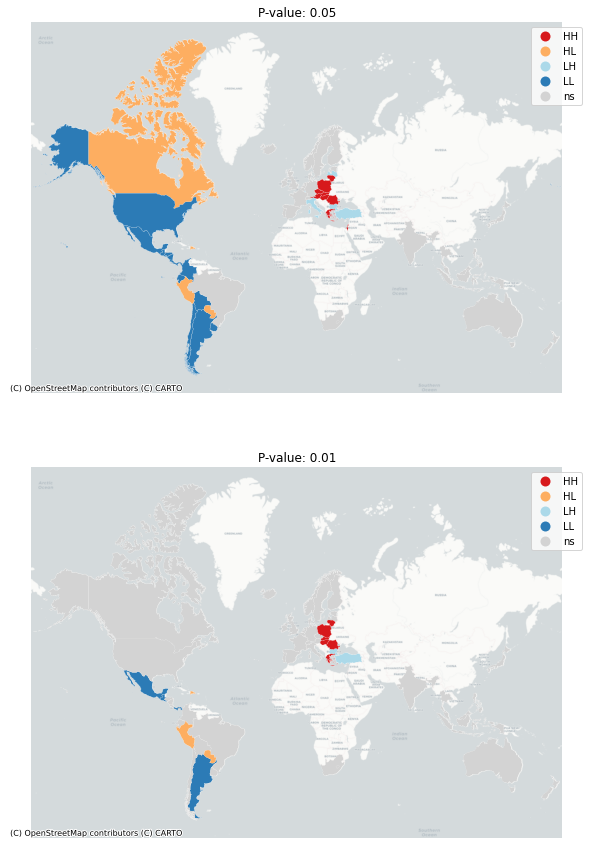

In [47]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Loudness 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [48]:
sdf = jdf[['Country','loudness','geometry']]
sdf.head()

,Country,loudness,geometry
0,Argentina,-7.163733,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,-6.718895,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,-6.651115,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,-6.598304,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,-7.073698,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [49]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [50]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [51]:
# create a new column for the spatial lag
sdf['loudness_lag'] = lps.weights.lag_spatial(wq, sdf['loudness'])

In [52]:
sdf.sample(10)

,Country,loudness,geometry,loudness_lag
53,Thailand,-6.678322,"MULTIPOLYGON (((11321141.584 642391.919, 11320...",-6.691995
19,Germany,-6.643288,"MULTIPOLYGON (((856850.403 6031214.222, 852274...",-6.528098
7,Canada,-6.594242,"MULTIPOLYGON (((-9688723.272 9735729.723, -969...",-6.788375
13,Dominican Republic,-6.143255,"MULTIPOLYGON (((-7788715.065 2087127.402, -779...",-6.838940
27,Ireland,-6.910269,"MULTIPOLYGON (((-1002039.385 7009973.877, -100...",-6.590790
16,Estonia,-6.537441,"MULTIPOLYGON (((3118707.621 8284557.732, 31198...",-6.542274
31,Latvia,-6.613669,"POLYGON ((2706731.445 7940440.483, 2707783.835...",-6.518002
9,Colombia,-6.630259,"MULTIPOLYGON (((-8333467.119 1246340.923, -833...",-6.729765
44,Poland,-6.008328,"POLYGON ((2525401.017 6373355.059, 2524554.984...",-6.528086
29,Italy,-6.589245,"MULTIPOLYGON (((1419721.279 5460955.481, 14209...",-6.469376


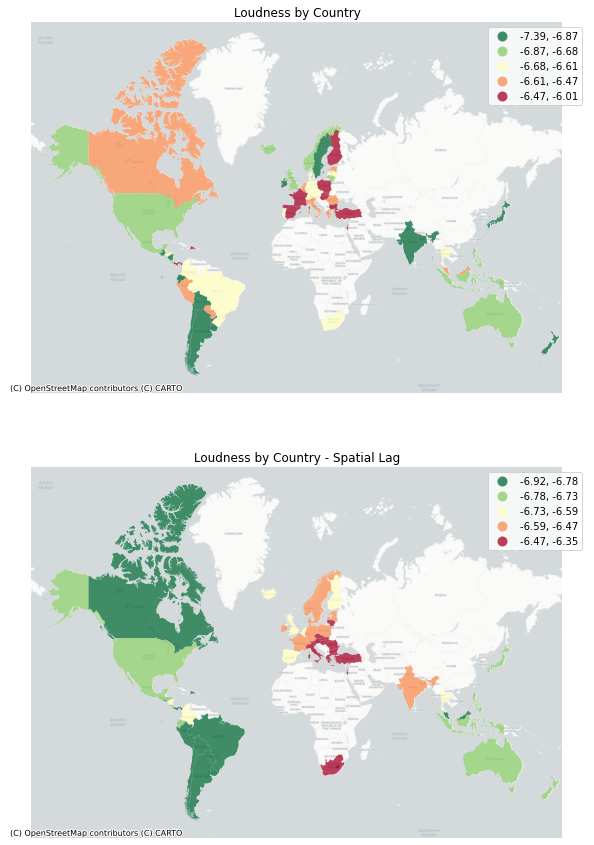

In [54]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='loudness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Loudness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='loudness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Loudness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [55]:
y = sdf.loudness
moran = Moran(y, wq)
moran.I

0.238595694573169

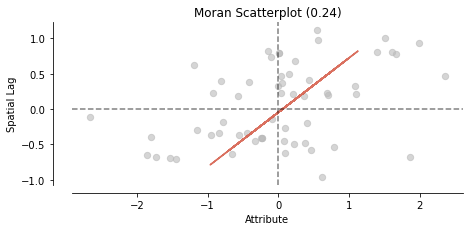

In [56]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b41507c0>)

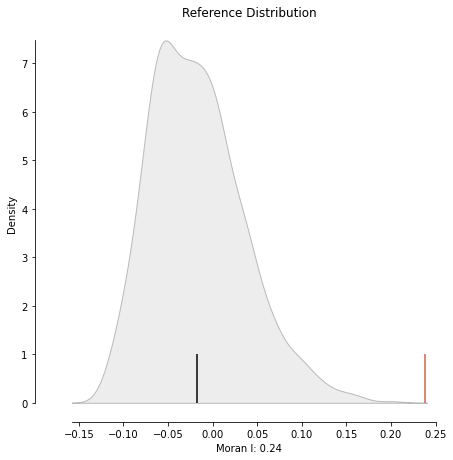

In [57]:
plot_moran_simulation(moran,aspect_equal=False)

In [58]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high loudness near other high loudness neighbors
- LL: low loudness geographies near other low loudness neighbors
- LH (donuts): low loudness geographies surrounded by high loudness neighbors
- HL (diamonds): high loudness geographies surrounded by low loudness neighbors

In [59]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

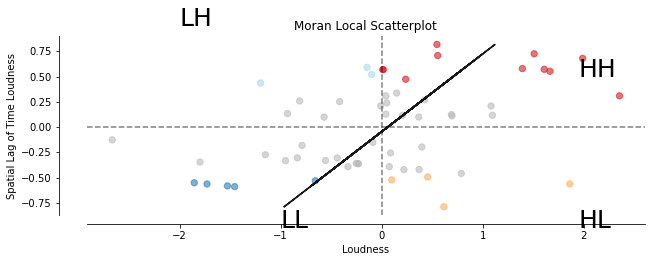

In [60]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Loudness")
ax.set_ylabel('Spatial Lag of Time Loudness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

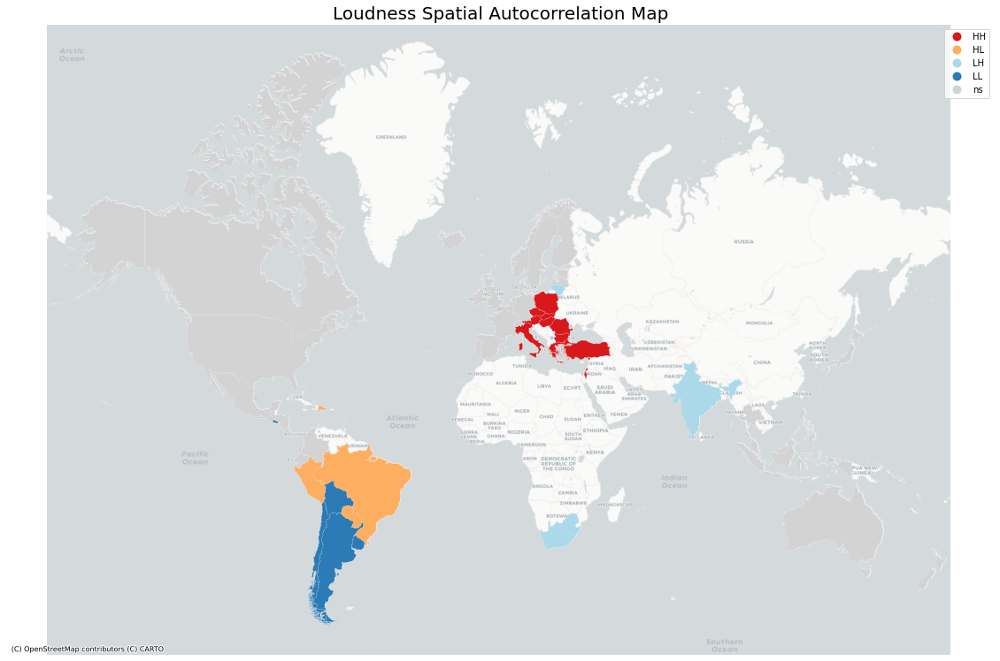

In [61]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Loudness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

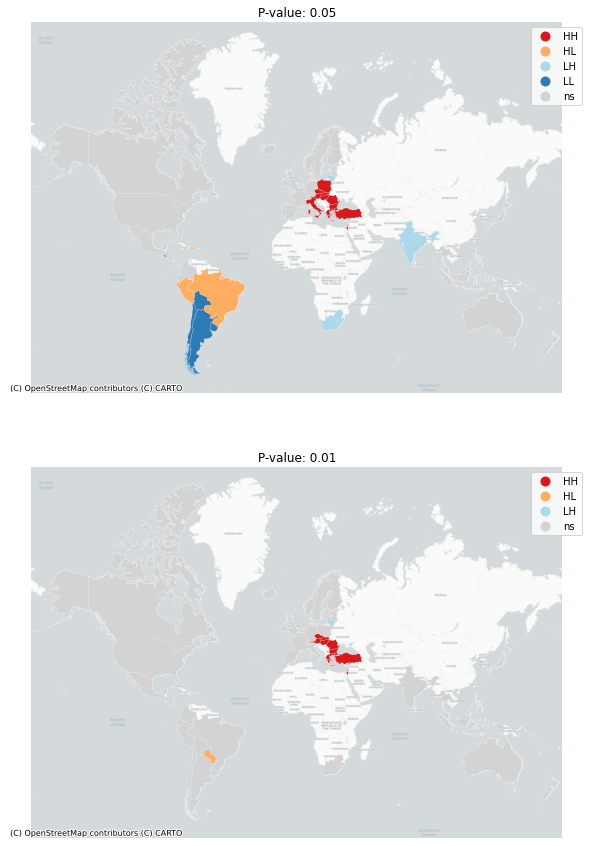

In [62]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Speechiness 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [63]:
sdf = jdf[['Country','speechiness','geometry']]
sdf.head()

,Country,speechiness,geometry
0,Argentina,0.109480,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.132742,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.132898,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.131102,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.105108,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [64]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [65]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [66]:
# create a new column for the spatial lag
sdf['speechiness_lag'] = lps.weights.lag_spatial(wq, sdf['speechiness'])

In [67]:
sdf.sample(10)

,Country,speechiness,geometry,speechiness_lag
6,Bulgaria,0.129914,"POLYGON ((2553179.327 5062937.070, 2555439.127...",0.130098
24,Iceland,0.145663,"POLYGON ((-2451781.372 9456940.889, -2451750.1...",0.139636
48,Slovakia,0.134067,"POLYGON ((2115212.060 6118333.999, 2113934.894...",0.128110
49,South Africa,0.130075,"MULTIPOLYGON (((1911539.794 -3261873.076, 1913...",0.121904
4,Bolivia,0.105108,"POLYGON ((-6923942.728 -2328958.066, -6931803....",0.110496
43,Philippines,0.109205,"MULTIPOLYGON (((13346381.206 1781703.566, 1334...",0.123731
3,Belgium,0.131102,"POLYGON ((461890.853 6442531.297, 461666.207 6...",0.133791
33,Luxembourg,0.126439,"POLYGON ((707601.357 6364565.204, 708301.681 6...",0.130910
18,France,0.099465,"MULTIPOLYGON (((198339.953 5246743.398, 193541...",0.128152
30,Japan,0.125982,"MULTIPOLYGON (((14950138.861 4123744.326, 1494...",0.121634


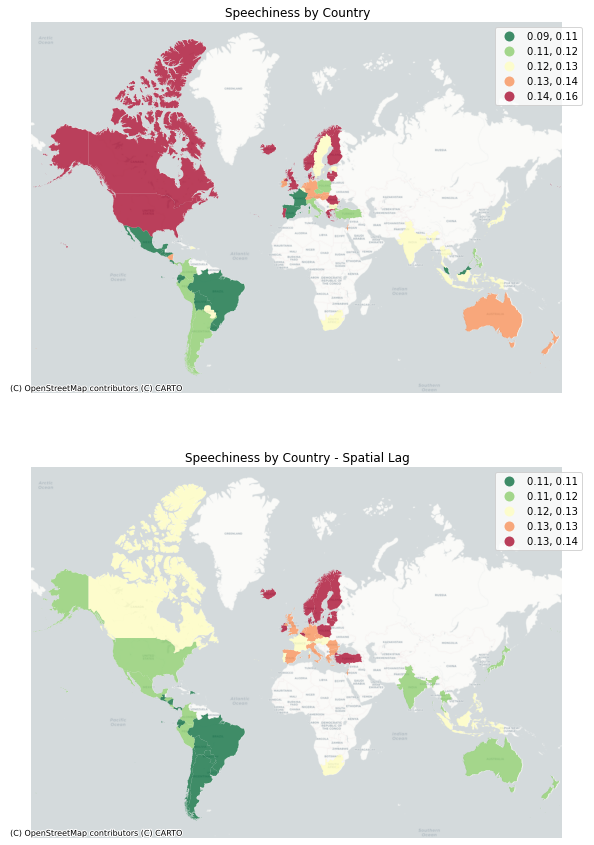

In [68]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='speechiness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Speechiness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='speechiness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Speechiness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [69]:
y = sdf.speechiness
moran = Moran(y, wq)
moran.I

0.2984446370272366

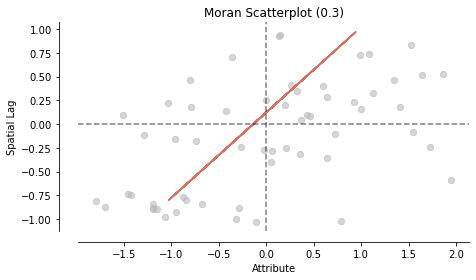

In [70]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43afc3d5e0>)

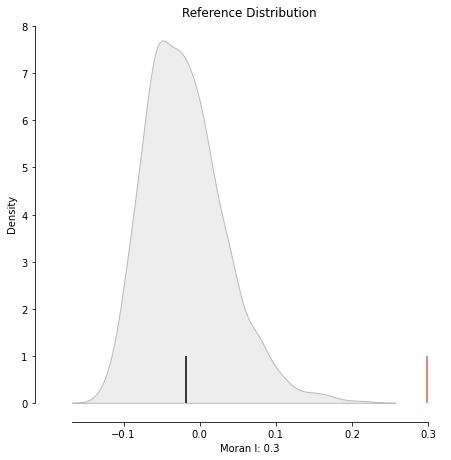

In [71]:
plot_moran_simulation(moran,aspect_equal=False)

In [72]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high speechiness near other high speechiness neighbors
- LL: low speechiness geographies near other low speechiness neighbors
- LH (donuts): low speechiness geographies surrounded by high speechiness neighbors
- HL (diamonds): high speechiness geographies surrounded by low speechiness neighbors

In [73]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

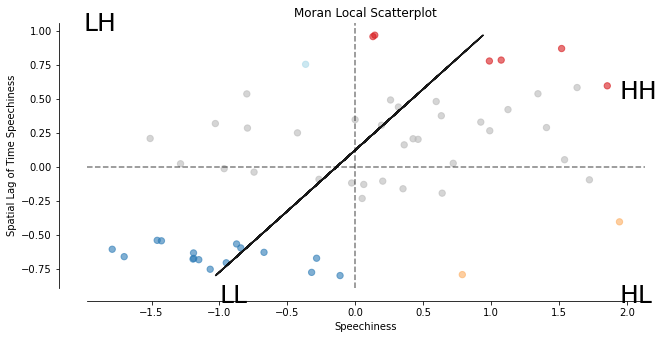

In [74]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Speechiness")
ax.set_ylabel('Spatial Lag of Time Speechiness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

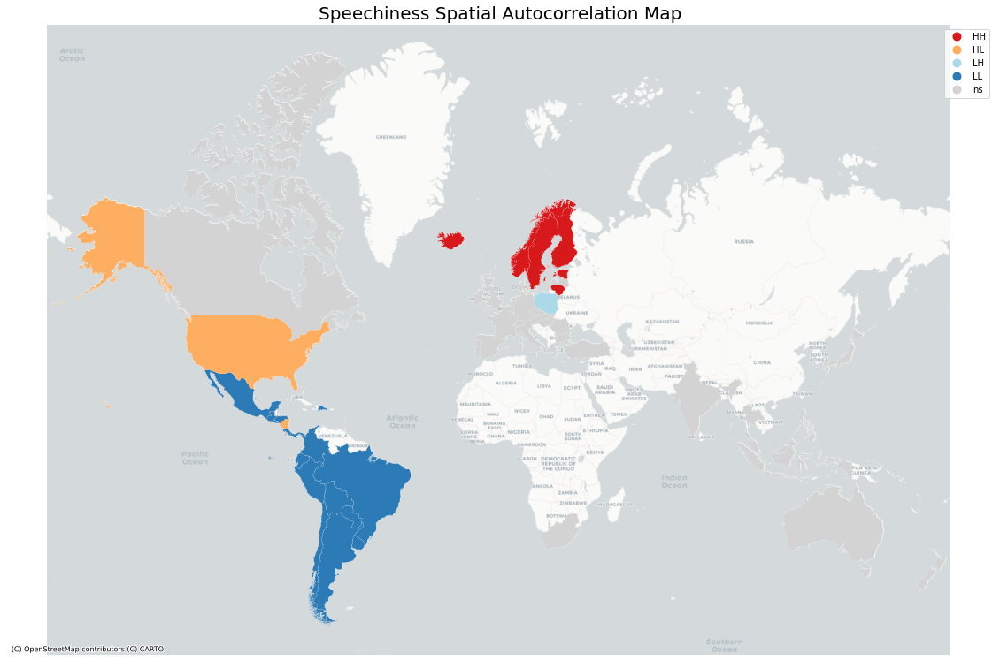

In [75]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Speechiness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

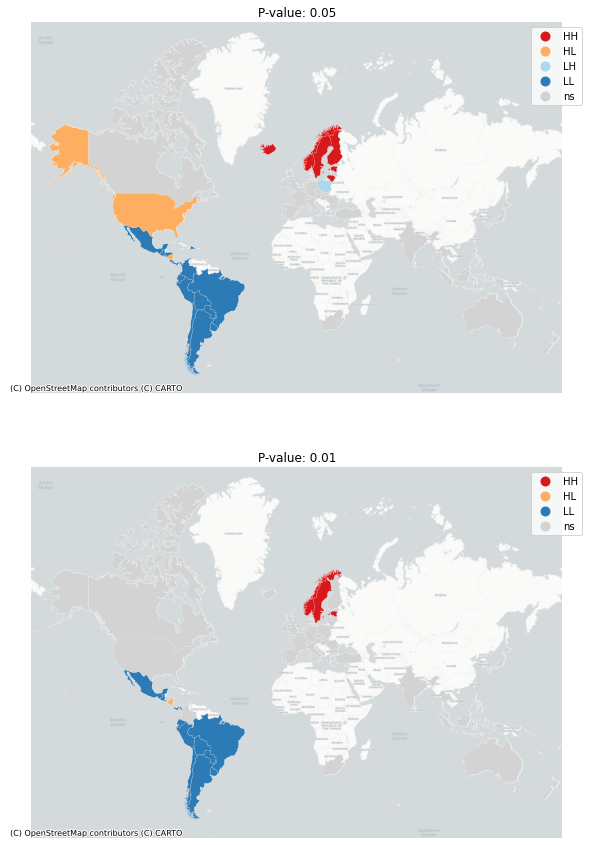

In [76]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Acousticness 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [77]:
sdf = jdf[['Country','acousticness','geometry']]
sdf.head()

,Country,acousticness,geometry
0,Argentina,0.257105,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.239568,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.241716,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.260051,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.253995,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [78]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [79]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [80]:
# create a new column for the spatial lag
sdf['acousticness_lag'] = lps.weights.lag_spatial(wq, sdf['acousticness'])

In [81]:
sdf.sample(10)

,Country,acousticness,geometry,acousticness_lag
17,Finland,0.246893,"MULTIPOLYGON (((2562273.131 8422307.547, 25651...",0.239471
47,Singapore,0.261492,"POLYGON ((11576173.543 154002.222, 11576998.30...",0.246098
36,Netherlands,0.256661,"MULTIPOLYGON (((419024.739 6682597.303, 430203...",0.238476
51,Sweden,0.237448,"MULTIPOLYGON (((1924373.918 8236588.364, 19249...",0.241776
12,Denmark,0.234482,"MULTIPOLYGON (((1069810.720 7438797.541, 10683...",0.236456
35,Mexico,0.235818,"MULTIPOLYGON (((-12418803.384 2805825.863, -12...",0.225163
23,Hungary,0.213277,"POLYGON ((2392190.087 5890733.477, 2388196.719...",0.236473
49,South Africa,0.245983,"MULTIPOLYGON (((1911539.794 -3261873.076, 1913...",0.236837
53,Thailand,0.251624,"MULTIPOLYGON (((11321141.584 642391.919, 11320...",0.247332
57,Uruguay,0.240506,"POLYGON ((-6499821.611 -3951518.978, -6502829....",0.242545


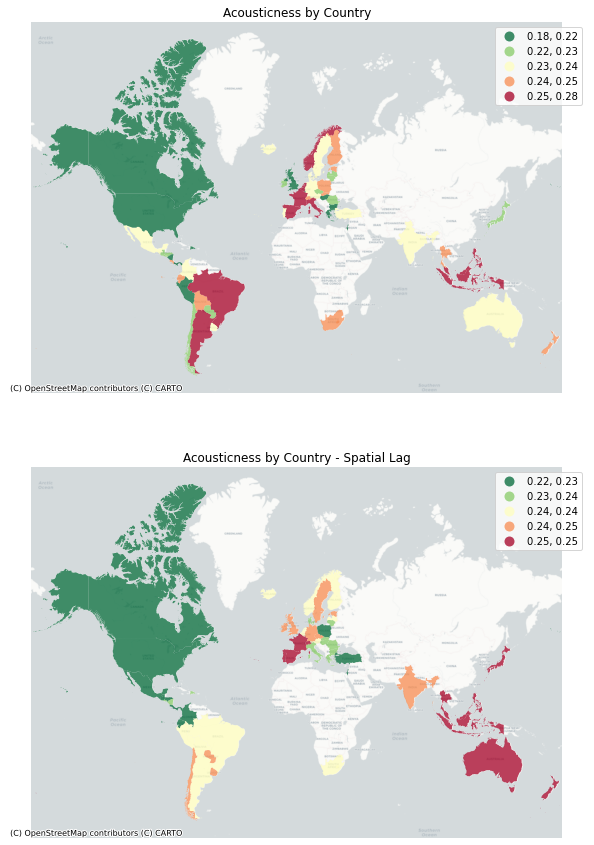

In [82]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='acousticness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Acousticness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='acousticness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Acousticness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [83]:
y = sdf.acousticness
moran = Moran(y, wq)
moran.I

0.1644021541696779

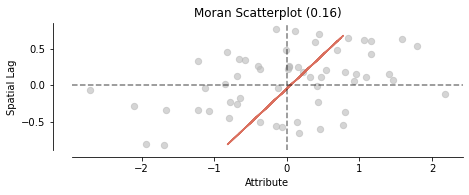

In [84]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b8783e50>)

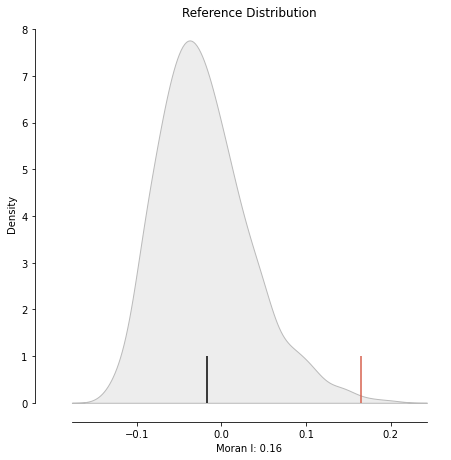

In [85]:
plot_moran_simulation(moran,aspect_equal=False)

In [86]:
moran.p_sim

0.005

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high acousticness near other high acousticness neighbors
- LL: low acousticness geographies near other low acousticness neighbors
- LH (donuts): low acousticness geographies surrounded by high acousticness neighbors
- HL (diamonds): high acousticness geographies surrounded by low acousticness neighbors

In [87]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

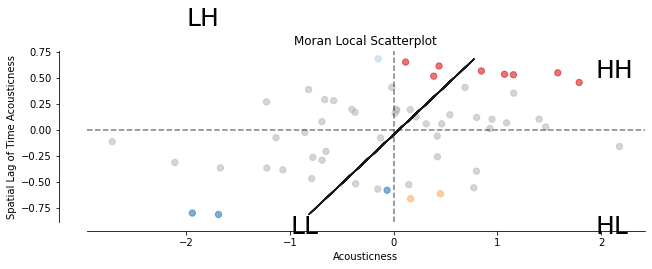

In [88]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Acousticness")
ax.set_ylabel('Spatial Lag of Time Acousticness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

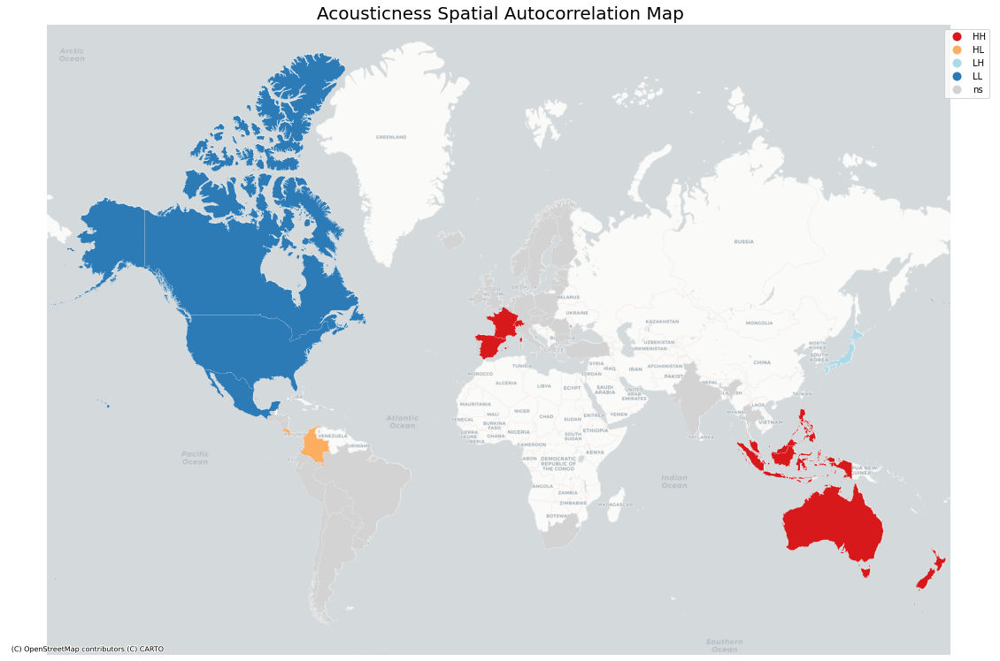

In [89]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Acousticness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

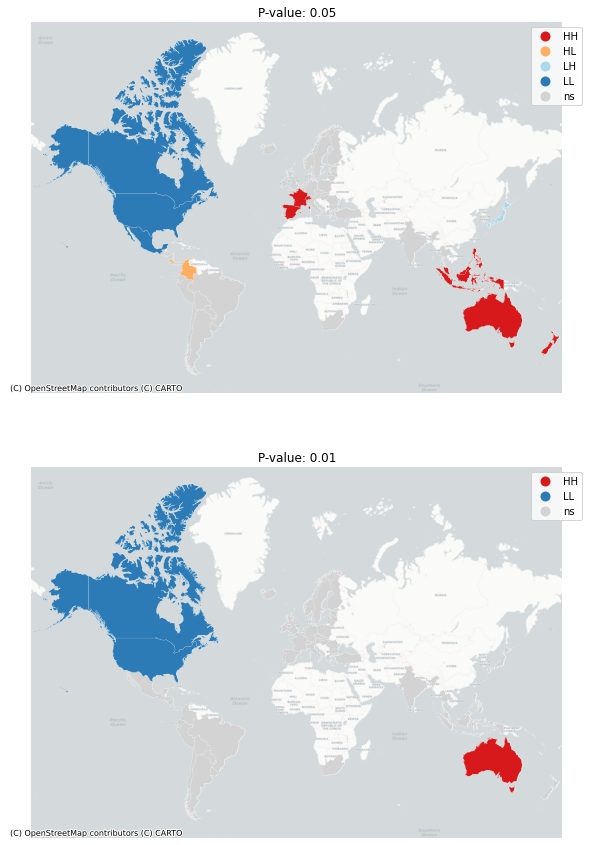

In [90]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Instrumentalness 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [91]:
sdf = jdf[['Country','instrumentalness','geometry']]
sdf.head()

,Country,instrumentalness,geometry
0,Argentina,0.067553,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.040624,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.064974,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.056351,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.062562,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [92]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [93]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [94]:
# create a new column for the spatial lag
sdf['instrumentalness_lag'] = lps.weights.lag_spatial(wq, sdf['instrumentalness'])

In [95]:
sdf.sample(10)

,Country,instrumentalness,geometry,instrumentalness_lag
19,Germany,0.082160,"MULTIPOLYGON (((856850.403 6031214.222, 852274...",0.060965
53,Thailand,0.023122,"MULTIPOLYGON (((11321141.584 642391.919, 11320...",0.056804
32,Lithuania,0.064549,"MULTIPOLYGON (((2616457.336 7160133.638, 26169...",0.054108
46,Romania,0.044792,"POLYGON ((2707257.640 5418615.317, 2705929.939...",0.057769
48,Slovakia,0.043899,"POLYGON ((2115212.060 6118333.999, 2113934.894...",0.063233
15,El Salvador,0.067584,"POLYGON ((-9762126.333 1553460.070, -9765503.3...",0.069413
39,Norway,0.059985,"MULTIPOLYGON (((1168330.473 9458211.247, 11710...",0.071851
47,Singapore,0.053274,"POLYGON ((11576173.543 154002.222, 11576998.30...",0.053034
13,Dominican Republic,0.038151,"MULTIPOLYGON (((-7788715.065 2087127.402, -779...",0.067303
49,South Africa,0.041491,"MULTIPOLYGON (((1911539.794 -3261873.076, 1913...",0.060433


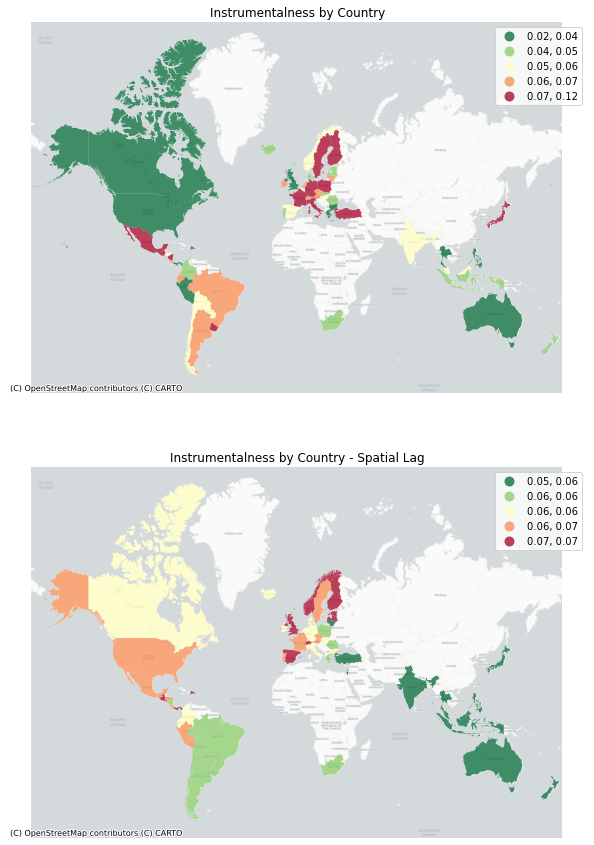

In [97]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='instrumentalness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Instrumentalness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='instrumentalness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Instrumentalness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [98]:
y = sdf.instrumentalness
moran = Moran(y, wq)
moran.I

-0.009639818907429909

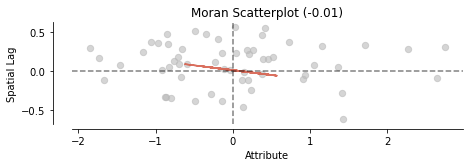

In [99]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43afbe3970>)

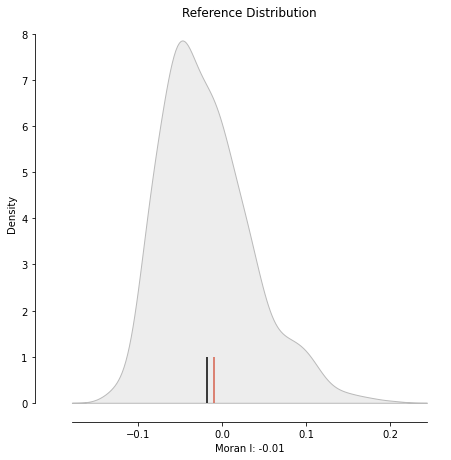

In [100]:
plot_moran_simulation(moran,aspect_equal=False)

In [101]:
moran.p_sim

0.383

Since the data is not statistically significant (p-value greater than 0.05), I will not be performing further analysis on it. Instead, I will move on to the next characteristic.

## Spatial Autocorrelation Analysis: Liveness 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [106]:
sdf = jdf[['Country','liveness','geometry']]
sdf.head()

,Country,liveness,geometry
0,Argentina,0.173236,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.174632,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.170697,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.178089,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.153766,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [107]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [108]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [109]:
# create a new column for the spatial lag
sdf['liveness_lag'] = lps.weights.lag_spatial(wq, sdf['liveness'])

In [110]:
sdf.sample(10)

,Country,liveness,geometry,liveness_lag
19,Germany,0.162528,"MULTIPOLYGON (((856850.403 6031214.222, 852274...",0.163906
42,Peru,0.161664,"POLYGON ((-7736674.195 -1979723.033, -7751177....",0.160358
55,United Kingdom,0.170771,"MULTIPOLYGON (((-541476.243 7289850.304, -5479...",0.158746
37,New Zealand,0.175022,"MULTIPOLYGON (((18613200.758 -5697053.307, 186...",0.165498
7,Canada,0.177878,"MULTIPOLYGON (((-9688723.272 9735729.723, -969...",0.168172
33,Luxembourg,0.117861,"POLYGON ((707601.357 6364565.204, 708301.681 6...",0.165409
15,El Salvador,0.163431,"POLYGON ((-9762126.333 1553460.070, -9765503.3...",0.163867
23,Hungary,0.173900,"POLYGON ((2392190.087 5890733.477, 2388196.719...",0.163989
13,Dominican Republic,0.159643,"MULTIPOLYGON (((-7788715.065 2087127.402, -779...",0.164044
25,India,0.167510,"MULTIPOLYGON (((7591744.401 2725002.975, 75929...",0.162296


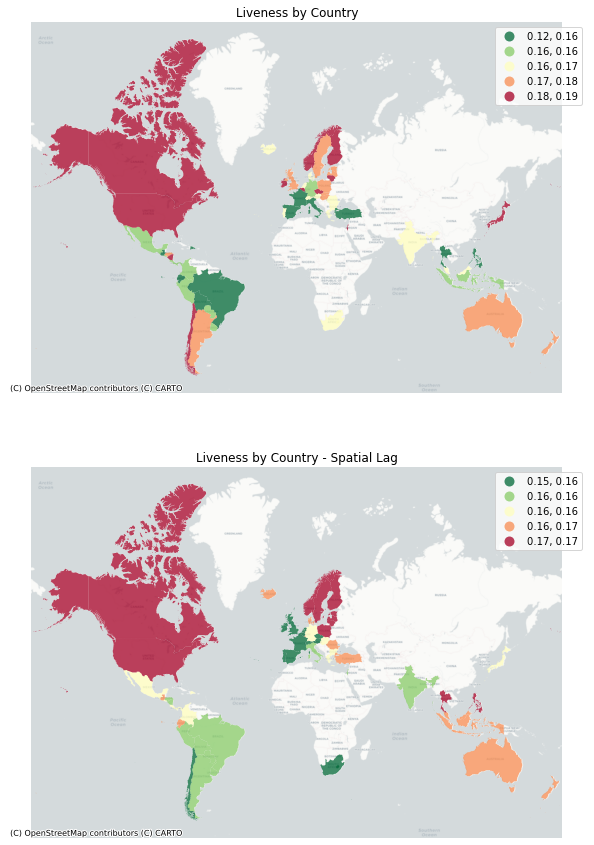

In [111]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='liveness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Liveness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='liveness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Liveness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [112]:
y = sdf.liveness
moran = Moran(y, wq)
moran.I

0.0756405481968685

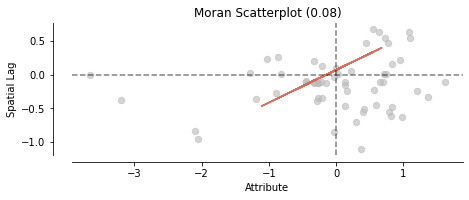

In [113]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b40e9d90>)

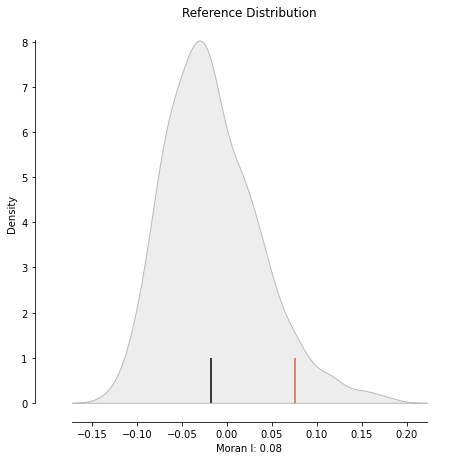

In [114]:
plot_moran_simulation(moran,aspect_equal=False)

In [115]:
moran.p_sim

0.059

Since the data is not statistically significant (p-value greater than 0.05), I will not be performing further analysis on it. Instead, I will move on to the next characteristic.

## Spatial Autocorrelation Analysis: Valence 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [120]:
sdf = jdf[['Country','valence','geometry']]
sdf.head()

,Country,valence,geometry
0,Argentina,0.423542,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.430022,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.436742,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.412002,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.433640,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [121]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [122]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [123]:
# create a new column for the spatial lag
sdf['valence_lag'] = lps.weights.lag_spatial(wq, sdf['valence'])

In [124]:
sdf.sample(10)

,Country,valence,geometry,valence_lag
22,Honduras,0.456256,"MULTIPOLYGON (((-9658547.553 1541045.627, -965...",0.438807
2,Austria,0.436742,"POLYGON ((1165652.677 5921100.999, 1167542.104...",0.434361
41,Paraguay,0.466845,"POLYGON ((-6420092.584 -2911936.267, -6423846....",0.444856
18,France,0.438042,"MULTIPOLYGON (((198339.953 5246743.398, 193541...",0.436672
12,Denmark,0.426991,"MULTIPOLYGON (((1069810.720 7438797.541, 10683...",0.422392
45,Portugal,0.423808,"MULTIPOLYGON (((-962417.777 5015082.916, -9637...",0.431092
32,Lithuania,0.400764,"MULTIPOLYGON (((2616457.336 7160133.638, 26169...",0.422407
52,Switzerland,0.430686,"POLYGON ((717670.648 5915905.222, 719155.329 5...",0.432303
50,Spain,0.466911,"MULTIPOLYGON (((-324464.894 4201125.976, -3271...",0.426255
33,Luxembourg,0.395306,"POLYGON ((707601.357 6364565.204, 708301.681 6...",0.430733


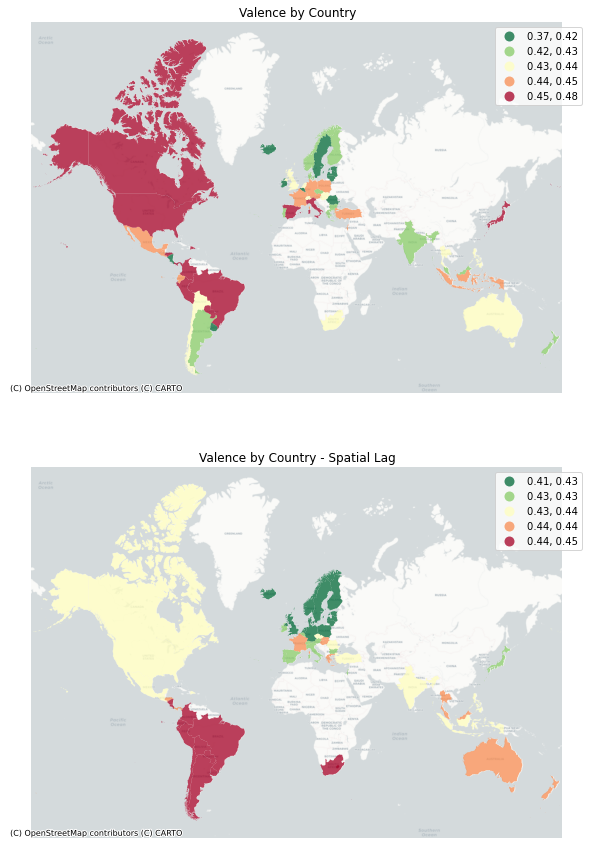

In [125]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='valence', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Valence by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='valence_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Valence by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [126]:
y = sdf.valence
moran = Moran(y, wq)
moran.I

0.06260812327014671

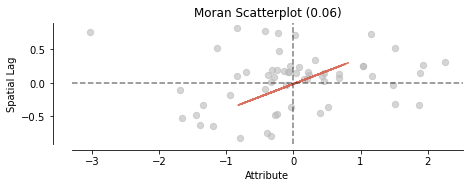

In [127]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b41616a0>)

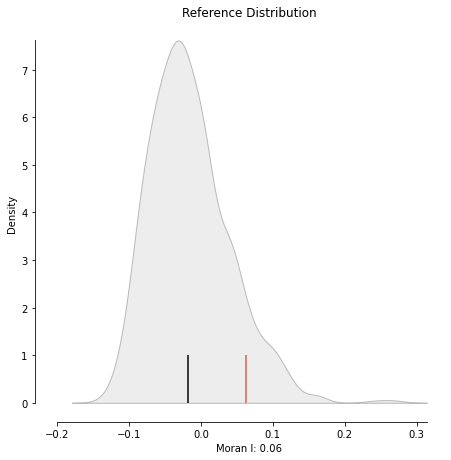

In [128]:
plot_moran_simulation(moran,aspect_equal=False)

In [129]:
moran.p_sim

0.093

Since the data is not statistically significant (p-value greater than 0.05), I will not be performing further analysis on it. Instead, I will move on to the next data set.

# May 2020 Song Characteristic Analysis
## Spatial Autocorrelation Analysis: Danceability 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [276]:
sdf = mdf[['Country','danceability','geometry']]
sdf.head()

,Country,danceability,geometry
0,Argentina,0.693941,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.692203,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.727636,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.710246,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.687700,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [277]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [278]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [279]:
# create a new column for the spatial lag
sdf['danceability_lag'] = lps.weights.lag_spatial(wq, sdf['danceability'])

In [280]:
sdf.sample(10)

,Country,danceability,geometry,danceability_lag
7,Canada,0.721515,"MULTIPOLYGON (((-9688723.272 9735729.723, -969...",0.695632
37,Netherlands,0.707579,"MULTIPOLYGON (((419024.739 6682597.303, 430203...",0.703863
43,Peru,0.678083,"POLYGON ((-7736674.195 -1979723.033, -7751177....",0.686853
49,Slovakia,0.707047,"POLYGON ((2115212.060 6118333.999, 2113934.894...",0.715281
32,Lithuania,0.705403,"MULTIPOLYGON (((2616457.336 7160133.638, 26169...",0.707915
41,Panama,0.635800,"MULTIPOLYGON (((-8908508.221 938624.438, -8913...",0.690542
13,Dominican Republic,0.652833,"MULTIPOLYGON (((-7788715.065 2087127.402, -779...",0.688413
45,Poland,0.701038,"POLYGON ((2525401.017 6373355.059, 2524554.984...",0.710893
6,Bulgaria,0.727946,"POLYGON ((2553179.327 5062937.070, 2555439.127...",0.707303
25,India,0.706250,"MULTIPOLYGON (((7591744.401 2725002.975, 75929...",0.678990


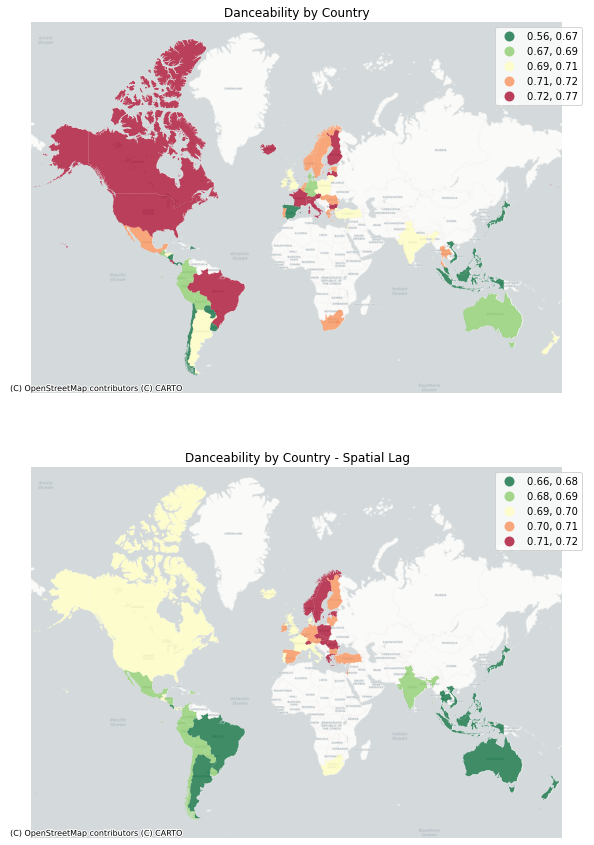

In [281]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='danceability', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Danceability by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='danceability_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Danceability by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [140]:
y = sdf.danceability
moran = Moran(y, wq)
moran.I

0.14831000265088293

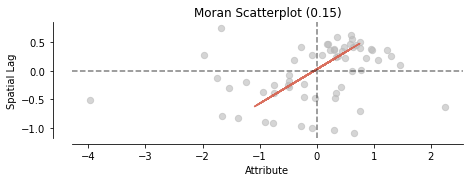

In [141]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43af985700>)

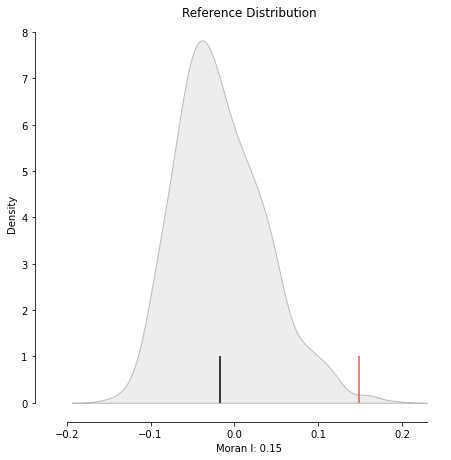

In [142]:
plot_moran_simulation(moran,aspect_equal=False)

In [143]:
moran.p_sim

0.007

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [144]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

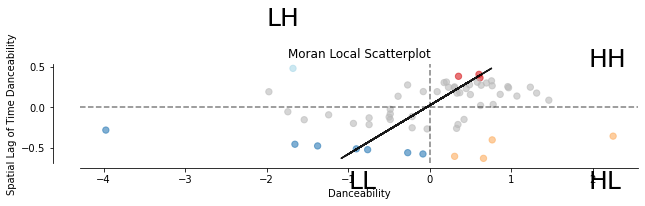

In [145]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Danceability")
ax.set_ylabel('Spatial Lag of Time Danceability')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

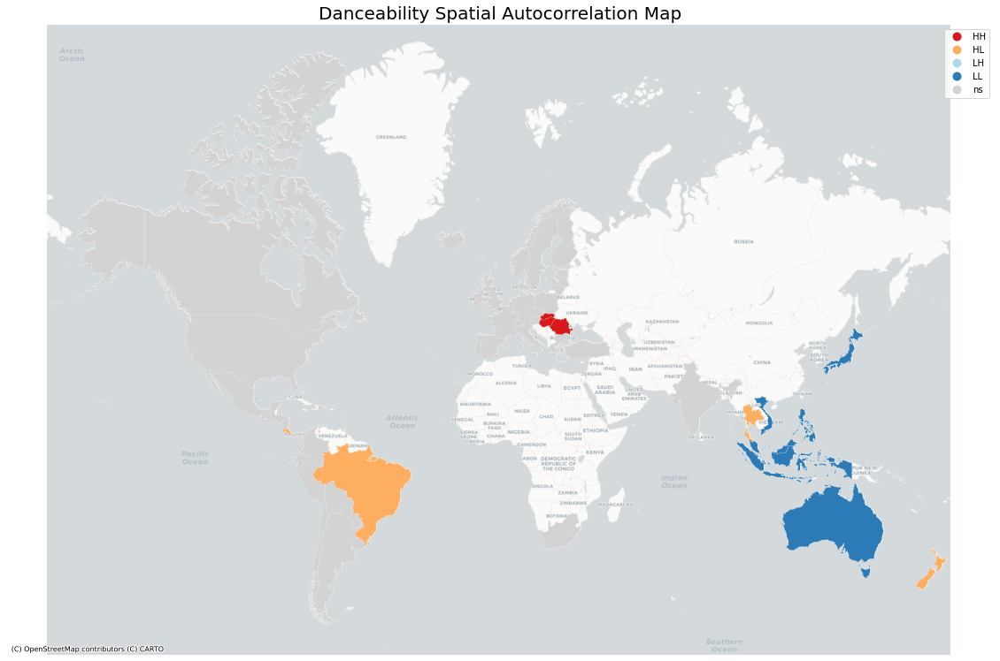

In [146]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Danceability Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

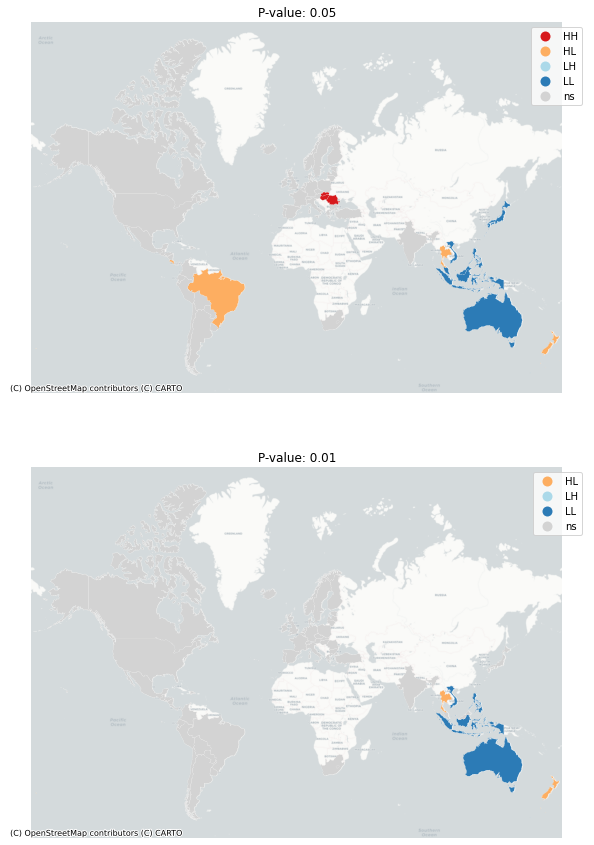

In [147]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Energy 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [148]:
sdf = mdf[['Country','energy','geometry']]
sdf.head()

,Country,energy,geometry
0,Argentina,0.659353,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.628671,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.626455,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.593783,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.727100,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [149]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [150]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [151]:
# create a new column for the spatial lag
sdf['energy_lag'] = lps.weights.lag_spatial(wq, sdf['energy'])

In [152]:
sdf.sample(10)

,Country,energy,geometry,energy_lag
57,United States,0.616529,"MULTIPOLYGON (((-8504253.492 4754669.580, -850...",0.689177
20,Greece,0.629434,"MULTIPOLYGON (((2346953.847 4729791.475, 23427...",0.640393
6,Bulgaria,0.625351,"POLYGON ((2553179.327 5062937.070, 2555439.127...",0.640903
21,Guatemala,0.727444,"POLYGON ((-9946208.251 1623823.844, -9955921.4...",0.697425
10,Costa Rica,0.659955,"POLYGON ((-9487402.975 1088082.737, -9493157.1...",0.706809
48,Singapore,0.625047,"POLYGON ((11576173.543 154002.222, 11576998.30...",0.631339
9,Colombia,0.727444,"MULTIPOLYGON (((-8333467.119 1246340.923, -833...",0.698557
35,Malta,0.656368,"POLYGON ((1616327.636 4273136.488, 1605660.229...",0.632195
58,Uruguay,0.694273,"POLYGON ((-6499821.611 -3951518.978, -6502829....",0.705775
13,Dominican Republic,0.659250,"MULTIPOLYGON (((-7788715.065 2087127.402, -779...",0.706897


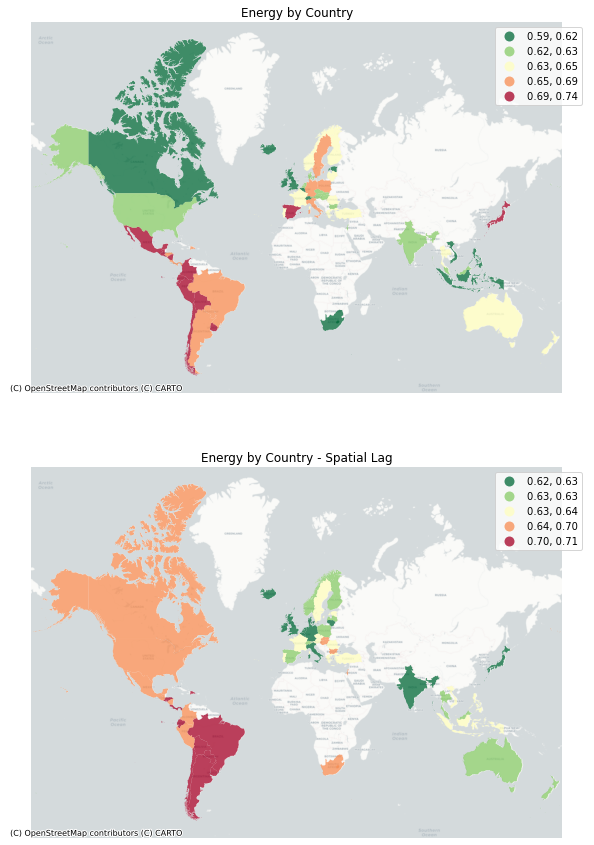

In [153]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='energy', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Energy by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='energy_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Energy by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [154]:
y = sdf.energy
moran = Moran(y, wq)
moran.I

0.5171406635132875

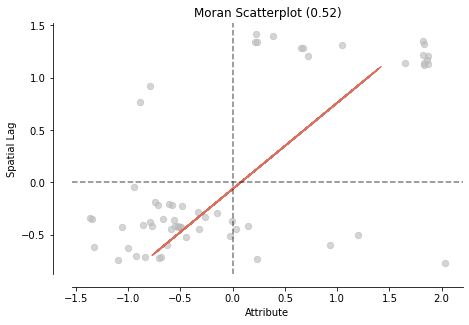

In [155]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b87e0490>)

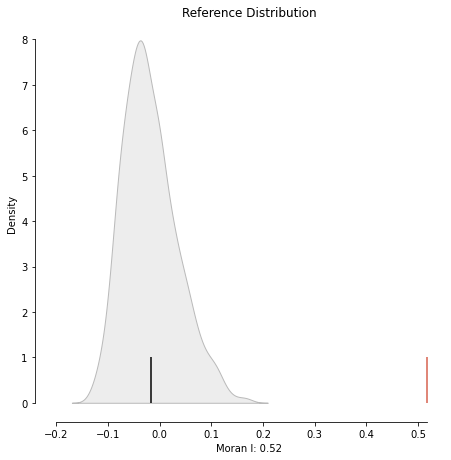

In [156]:
plot_moran_simulation(moran,aspect_equal=False)

In [157]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [158]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

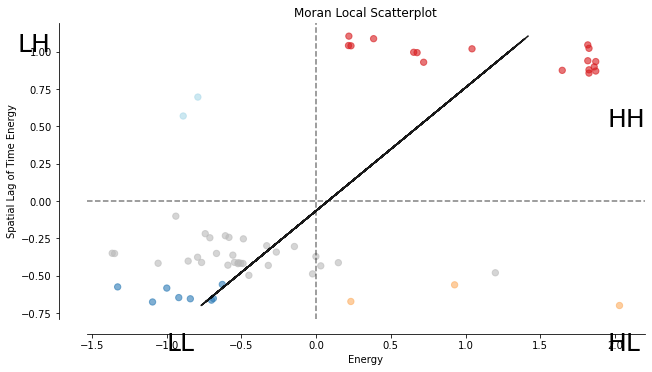

In [159]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Energy")
ax.set_ylabel('Spatial Lag of Time Energy')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

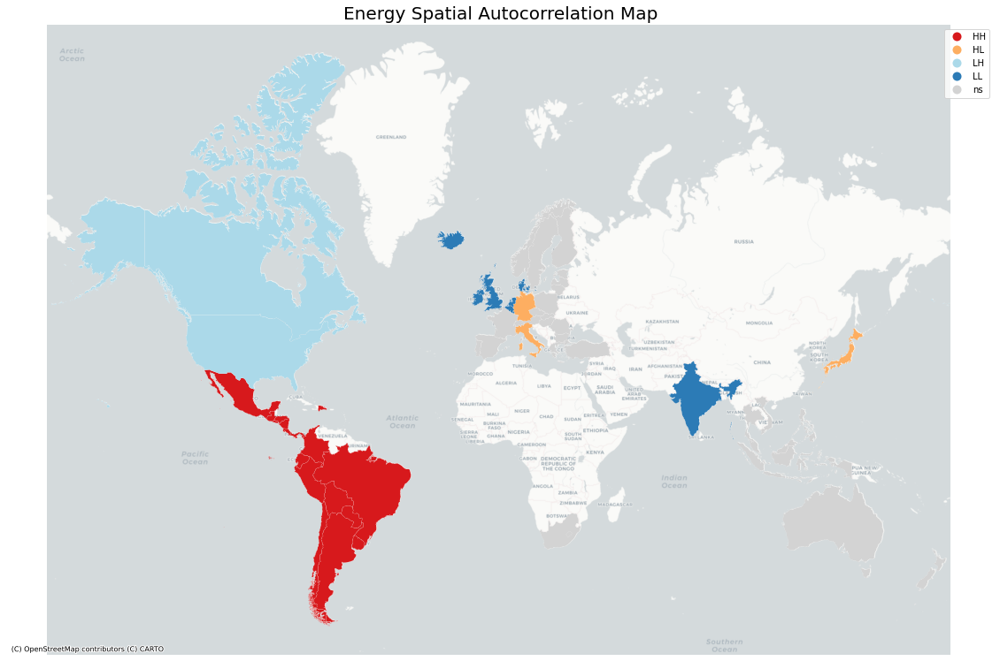

In [160]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Energy Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

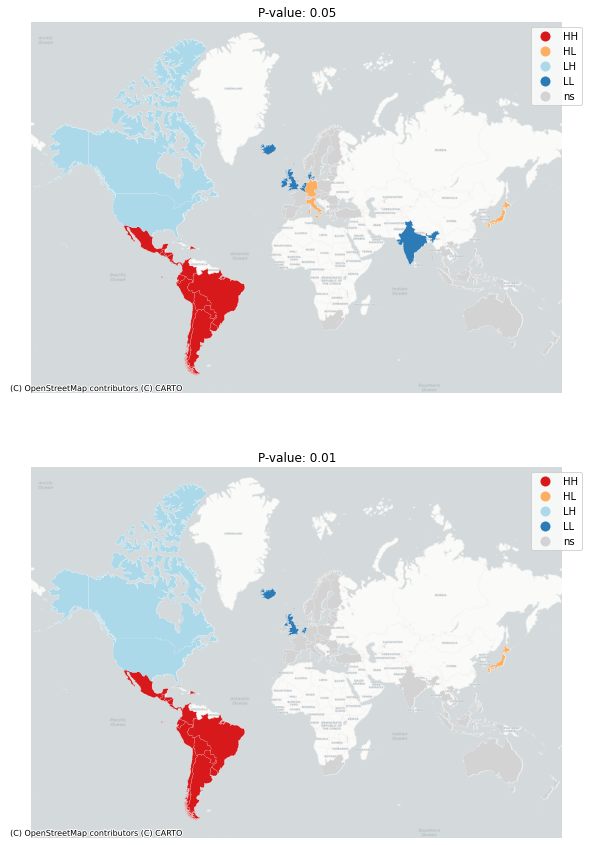

In [161]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Loudness 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [162]:
sdf = mdf[['Country','loudness','geometry']]
sdf.head()

,Country,loudness,geometry
0,Argentina,-6.295824,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,-6.683797,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,-6.766836,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,-6.911913,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,-4.870500,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [163]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [164]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [165]:
# create a new column for the spatial lag
sdf['loudness_lag'] = lps.weights.lag_spatial(wq, sdf['loudness'])

In [166]:
sdf.sample(10)

,Country,loudness,geometry,loudness_lag
20,Greece,-6.785395,"MULTIPOLYGON (((2346953.847 4729791.475, 23427...",-6.589723
42,Paraguay,-5.904727,"POLYGON ((-6420092.584 -2911936.267, -6423846....",-5.304194
51,Spain,-5.294333,"MULTIPOLYGON (((-324464.894 4201125.976, -3271...",-6.655843
17,Finland,-6.627867,"MULTIPOLYGON (((2562273.131 8422307.547, 25651...",-6.638829
46,Portugal,-6.580677,"MULTIPOLYGON (((-962417.777 5015082.916, -9637...",-6.523320
41,Panama,-5.832700,"MULTIPOLYGON (((-8908508.221 938624.438, -8913...",-5.251317
4,Bolivia,-4.870500,"POLYGON ((-6923942.728 -2328958.066, -6931803....",-5.433473
2,Austria,-6.766836,"POLYGON ((1165652.677 5921100.999, 1167542.104...",-6.464034
53,Switzerland,-6.675891,"POLYGON ((717670.648 5915905.222, 719155.329 5...",-6.569510
30,Japan,-6.520636,"MULTIPOLYGON (((14950138.861 4123744.326, 1494...",-6.720056


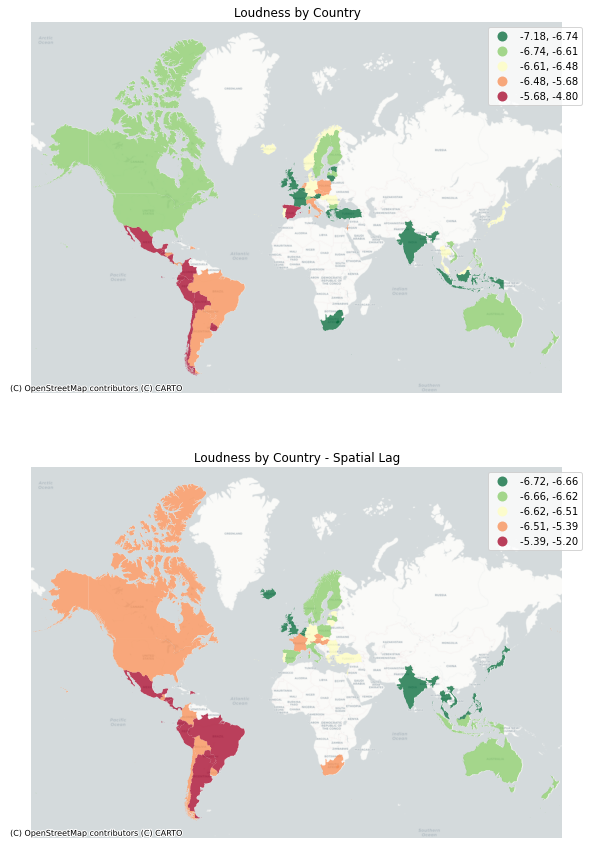

In [168]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='loudness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Loudness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='loudness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Loudness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [169]:
y = sdf.loudness
moran = Moran(y, wq)
moran.I

0.6758163213484567

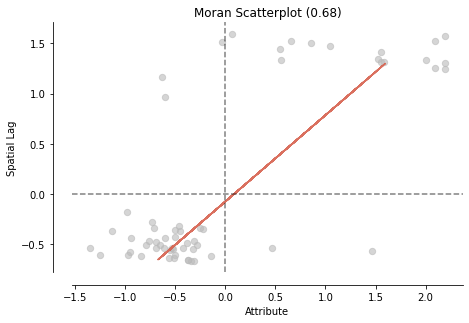

In [170]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b408e880>)

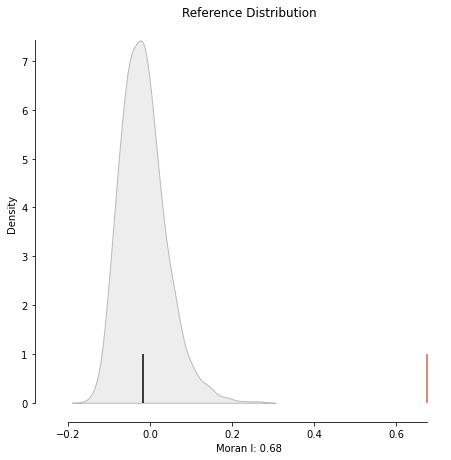

In [171]:
plot_moran_simulation(moran,aspect_equal=False)

In [172]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [173]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

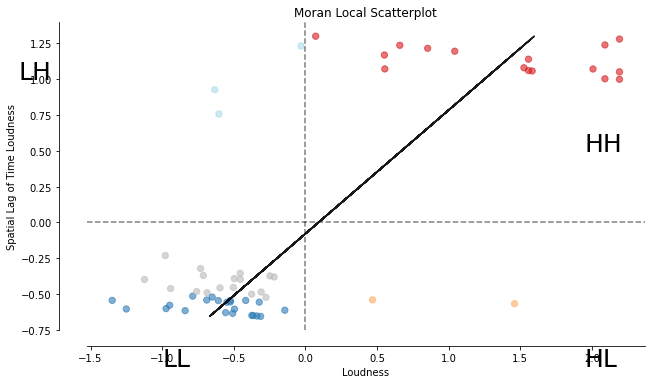

In [174]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Loudness")
ax.set_ylabel('Spatial Lag of Time Loudness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

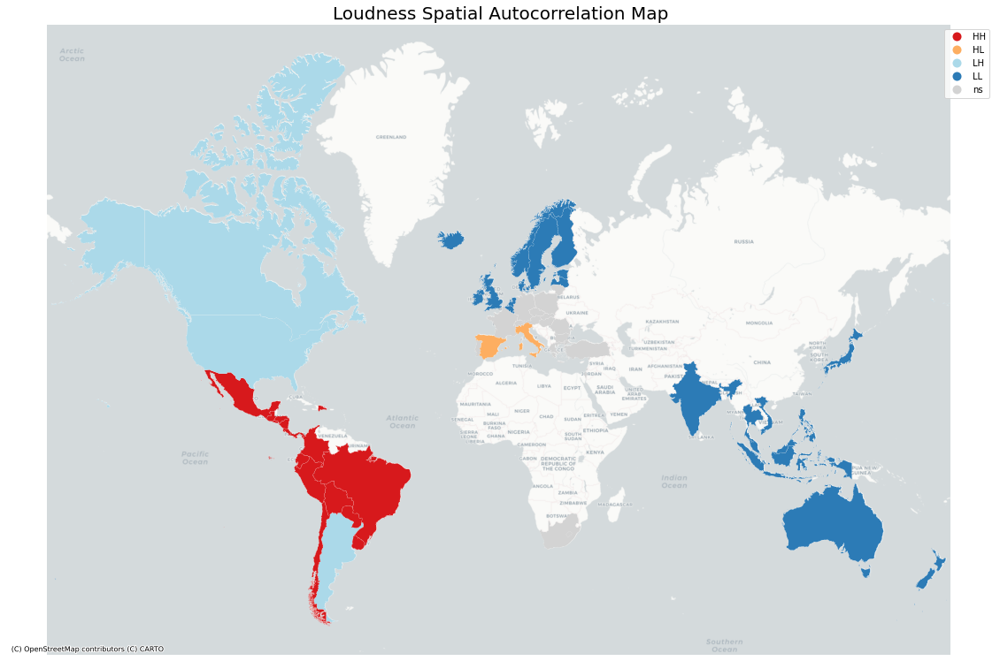

In [175]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Loudness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

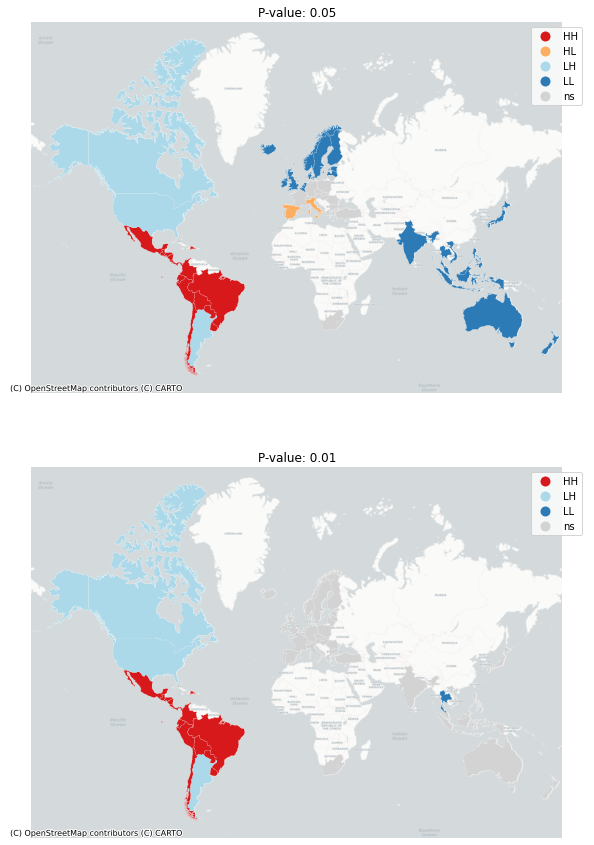

In [176]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Speechiness 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [177]:
sdf = mdf[['Country','speechiness','geometry']]
sdf.head()

,Country,speechiness,geometry
0,Argentina,0.146606,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.108065,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.127291,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.109658,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.082850,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [178]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [179]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [180]:
# create a new column for the spatial lag
sdf['speechiness_lag'] = lps.weights.lag_spatial(wq, sdf['speechiness'])

In [181]:
sdf.sample(10)

,Country,speechiness,geometry,speechiness_lag
22,Honduras,0.107364,"MULTIPOLYGON (((-9658547.553 1541045.627, -965...",0.088442
19,Germany,0.144791,"MULTIPOLYGON (((856850.403 6031214.222, 852274...",0.108408
28,Israel,0.116987,"MULTIPOLYGON (((3937162.908 3623488.292, 39360...",0.118923
52,Sweden,0.119907,"MULTIPOLYGON (((1924373.918 8236588.364, 19249...",0.114087
59,Vietnam,0.087521,"MULTIPOLYGON (((11919975.671 1933404.703, 1192...",0.105300
32,Lithuania,0.117364,"MULTIPOLYGON (((2616457.336 7160133.638, 26169...",0.110899
42,Paraguay,0.079736,"POLYGON ((-6420092.584 -2911936.267, -6423846....",0.092645
46,Portugal,0.105290,"MULTIPOLYGON (((-962417.777 5015082.916, -9637...",0.115824
37,Netherlands,0.087989,"MULTIPOLYGON (((419024.739 6682597.303, 430203...",0.114462
57,United States,0.122403,"MULTIPOLYGON (((-8504253.492 4754669.580, -850...",0.096180


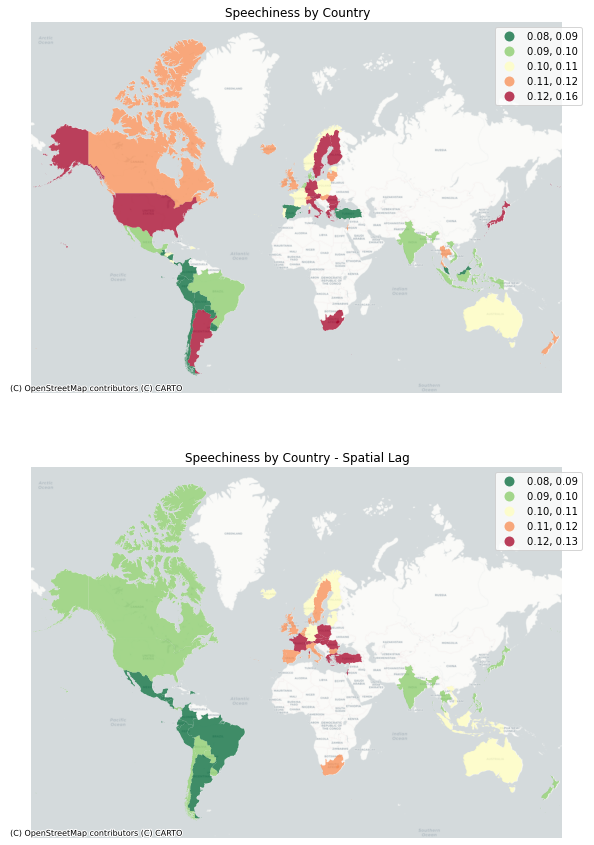

In [182]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='speechiness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Speechiness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='speechiness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Speechiness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [183]:
y = sdf.speechiness
moran = Moran(y, wq)
moran.I

0.18591185210765682

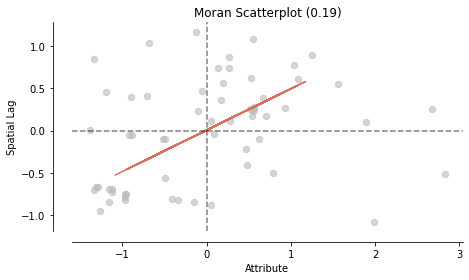

In [184]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43af9deeb0>)

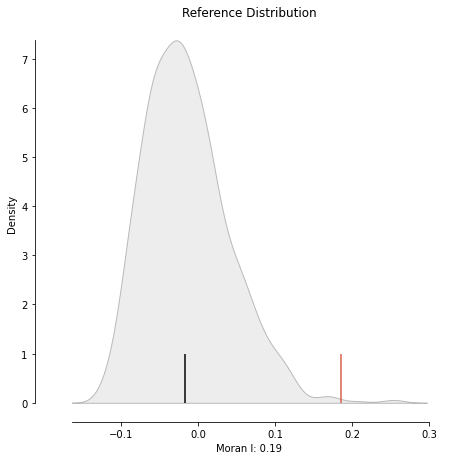

In [185]:
plot_moran_simulation(moran,aspect_equal=False)

In [186]:
moran.p_sim

0.004

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [187]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

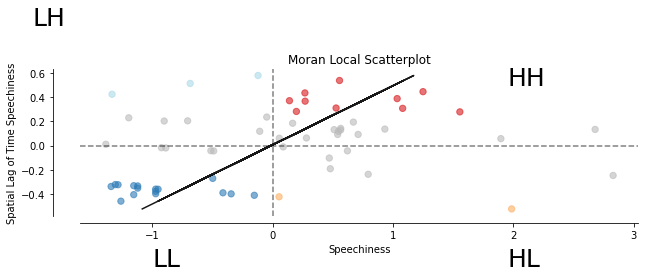

In [188]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Speechiness")
ax.set_ylabel('Spatial Lag of Time Speechiness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

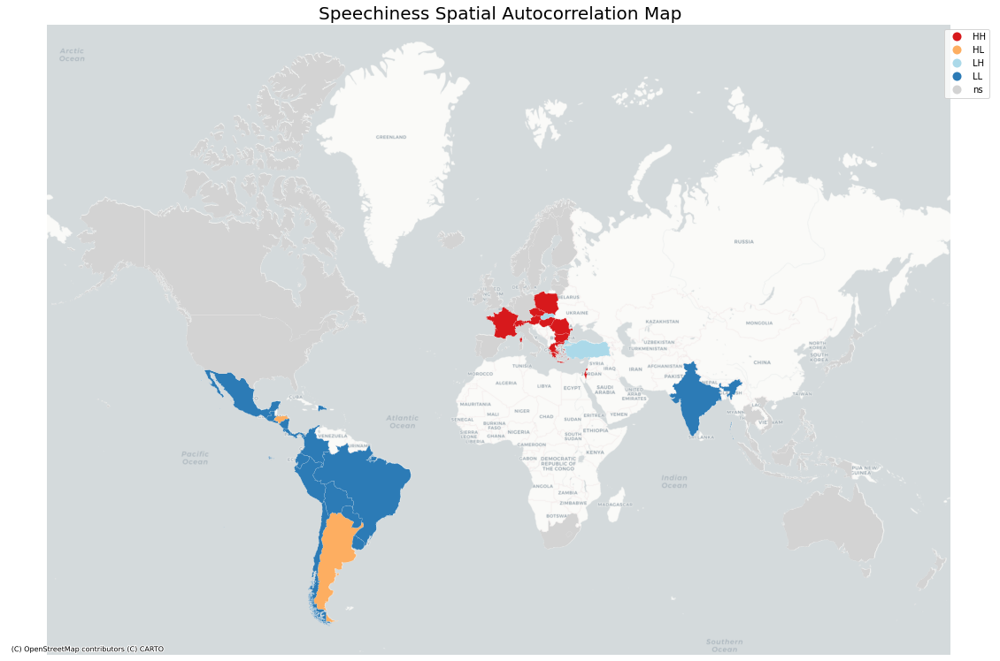

In [189]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Speechiness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

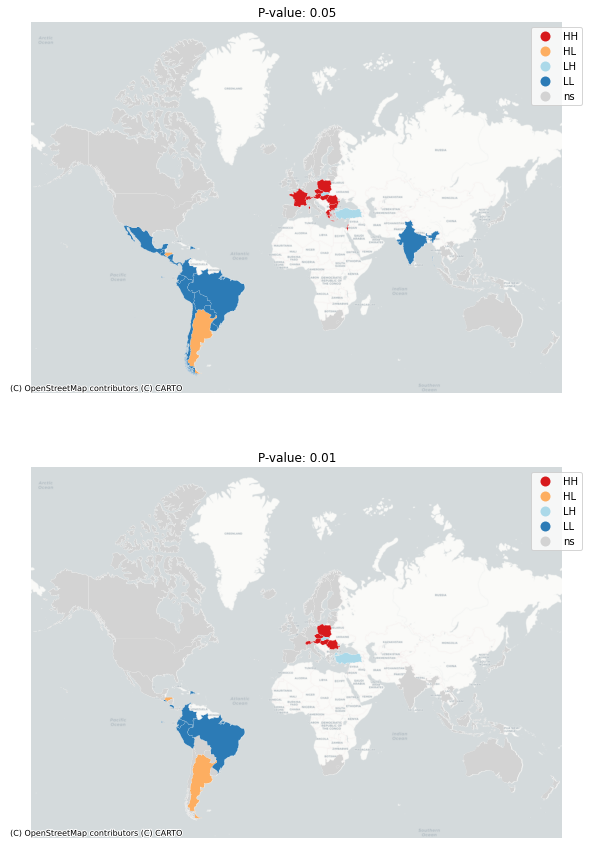

In [190]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Acousticness 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [191]:
sdf = mdf[['Country','acousticness','geometry']]
sdf.head()

,Country,acousticness,geometry
0,Argentina,0.172241,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.198552,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.167883,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.224307,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.216520,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [192]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [193]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [194]:
# create a new column for the spatial lag
sdf['acousticness_lag'] = lps.weights.lag_spatial(wq, sdf['acousticness'])

In [195]:
sdf.sample(10)

,Country,acousticness,geometry,acousticness_lag
38,New Zealand,0.203560,"MULTIPOLYGON (((18613200.758 -5697053.307, 186...",0.232853
46,Portugal,0.179623,"MULTIPOLYGON (((-962417.777 5015082.916, -9637...",0.212892
49,Slovakia,0.174677,"POLYGON ((2115212.060 6118333.999, 2113934.894...",0.172740
29,Italy,0.144703,"MULTIPOLYGON (((1419721.279 5460955.481, 14209...",0.192367
22,Honduras,0.253682,"MULTIPOLYGON (((-9658547.553 1541045.627, -965...",0.222335
4,Bolivia,0.216520,"POLYGON ((-6923942.728 -2328958.066, -6931803....",0.213272
0,Argentina,0.172241,"MULTIPOLYGON (((-7999325.541 -5014005.892, -79...",0.218807
43,Peru,0.206276,"POLYGON ((-7736674.195 -1979723.033, -7751177....",0.209684
25,India,0.199203,"MULTIPOLYGON (((7591744.401 2725002.975, 75929...",0.239415
26,Indonesia,0.265625,"MULTIPOLYGON (((12206022.235 230861.234, 12204...",0.224550


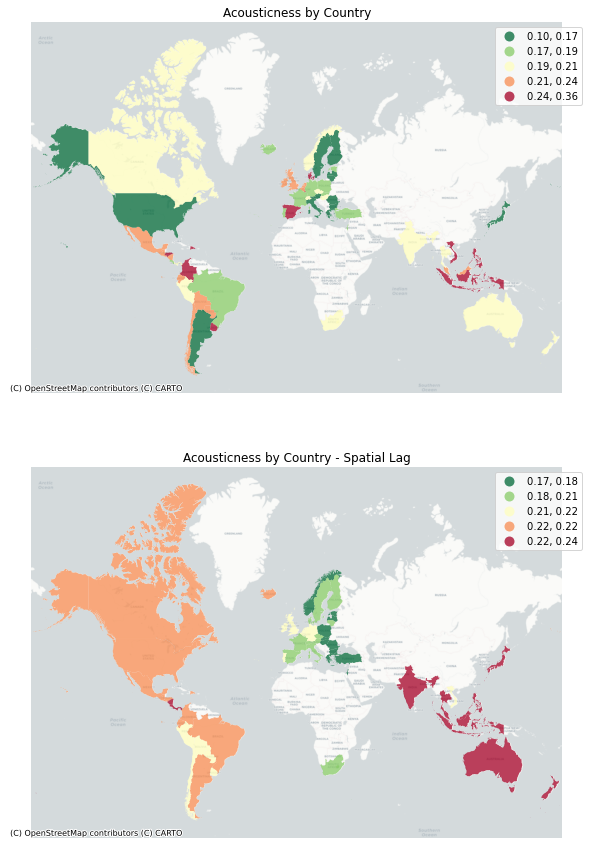

In [196]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='acousticness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Acousticness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='acousticness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Acousticness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [197]:
y = sdf.acousticness
moran = Moran(y, wq)
moran.I

0.19624506738115308

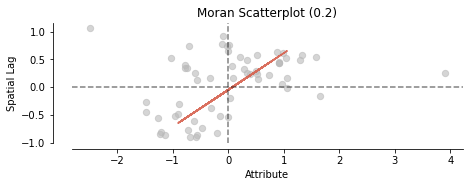

In [198]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43af9a4640>)

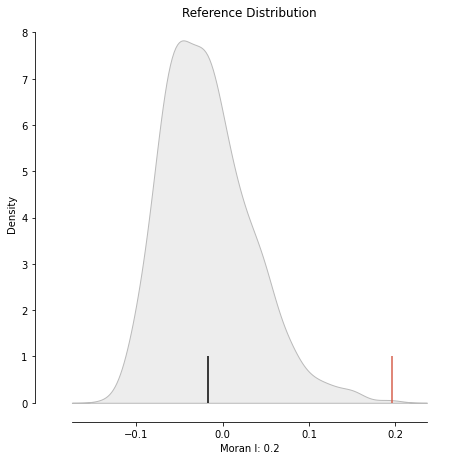

In [199]:
plot_moran_simulation(moran,aspect_equal=False)

In [200]:
moran.p_sim

0.002

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [201]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

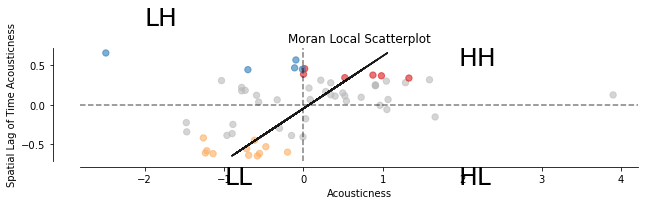

In [202]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Acousticness")
ax.set_ylabel('Spatial Lag of Time Acousticness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

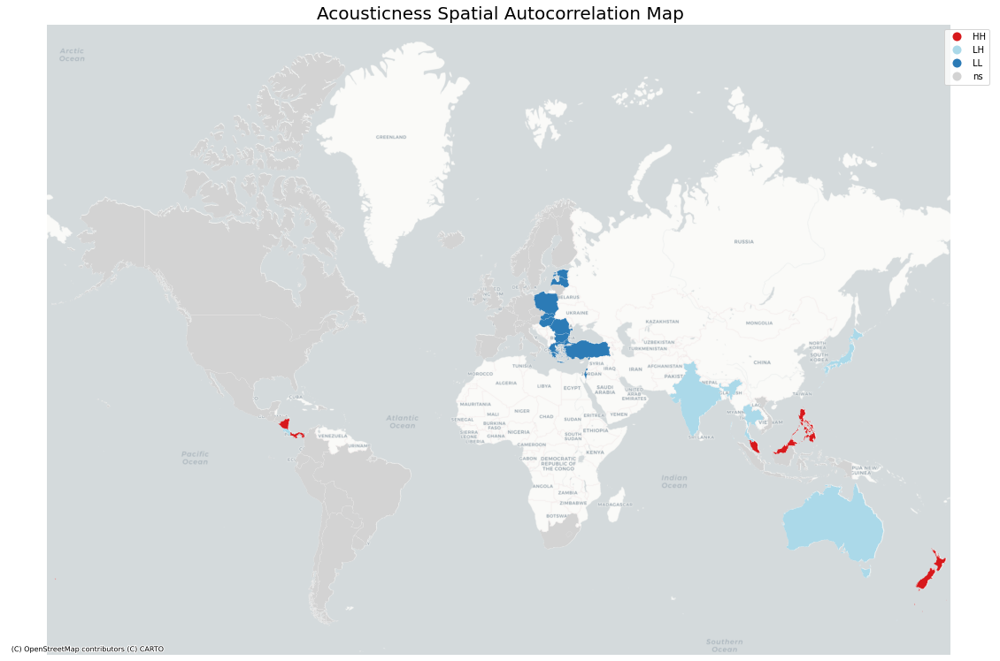

In [203]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Acousticness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

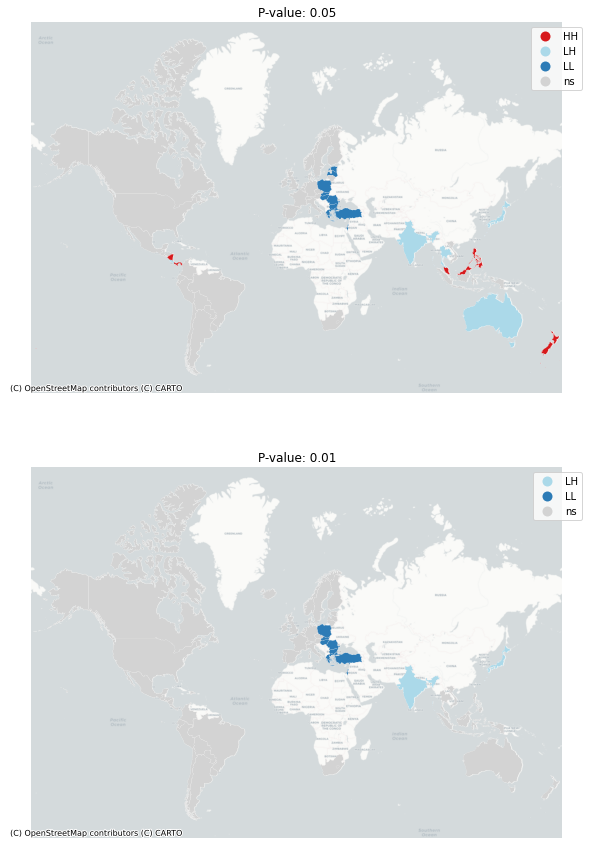

In [204]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Instrumentalness 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [205]:
sdf = mdf[['Country','instrumentalness','geometry']]
sdf.head()

,Country,instrumentalness,geometry
0,Argentina,0.000712,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.044756,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.030190,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.033749,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.001139,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [206]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [207]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [208]:
# create a new column for the spatial lag
sdf['instrumentalness_lag'] = lps.weights.lag_spatial(wq, sdf['instrumentalness'])

In [209]:
sdf.sample(10)

,Country,instrumentalness,geometry,instrumentalness_lag
6,Bulgaria,0.040260,"POLYGON ((2553179.327 5062937.070, 2555439.127...",0.040866
49,Slovakia,0.027399,"POLYGON ((2115212.060 6118333.999, 2113934.894...",0.025534
23,Hungary,0.039007,"POLYGON ((2392190.087 5890733.477, 2388196.719...",0.024083
40,Norway,0.034034,"MULTIPOLYGON (((1168330.473 9458211.247, 11710...",0.030613
50,South Africa,0.045666,"MULTIPOLYGON (((1911539.794 -3261873.076, 1913...",0.056482
25,India,0.079967,"MULTIPOLYGON (((7591744.401 2725002.975, 75929...",0.073826
57,United States,0.021629,"MULTIPOLYGON (((-8504253.492 4754669.580, -850...",0.014586
18,France,0.041666,"MULTIPOLYGON (((198339.953 5246743.398, 193541...",0.034091
35,Malta,0.080117,"POLYGON ((1616327.636 4273136.488, 1605660.229...",0.030256
32,Lithuania,0.054507,"MULTIPOLYGON (((2616457.336 7160133.638, 26169...",0.036610


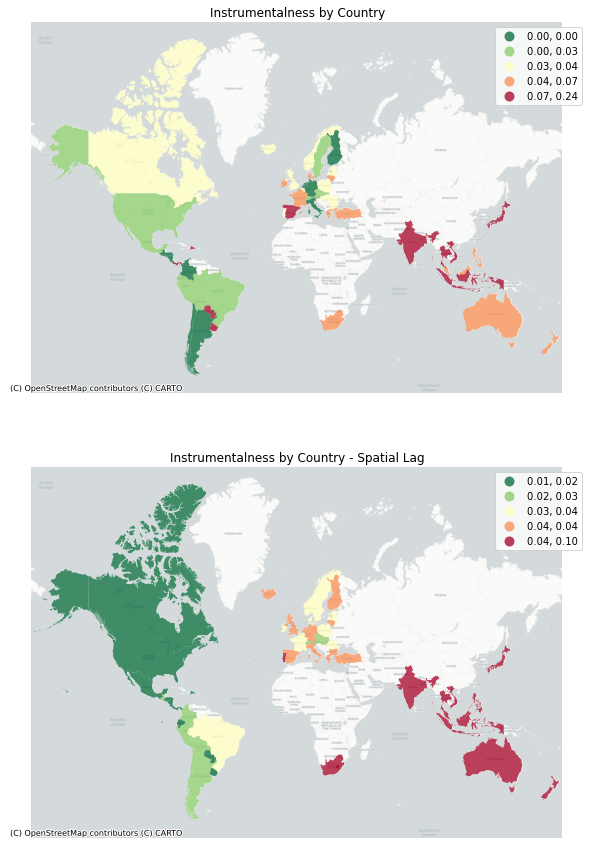

In [210]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='instrumentalness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Instrumentalness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='instrumentalness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Instrumentalness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [211]:
y = sdf.instrumentalness
moran = Moran(y, wq)
moran.I

0.28662666452951563

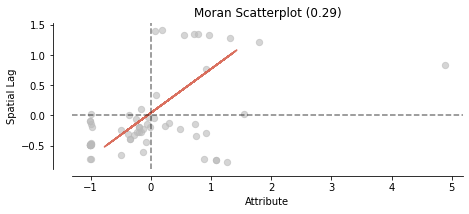

In [212]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43af833520>)

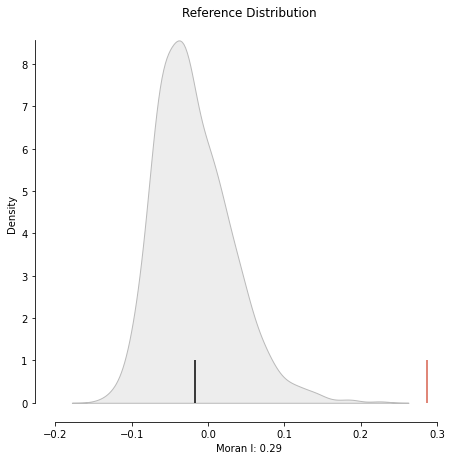

In [213]:
plot_moran_simulation(moran,aspect_equal=False)

In [214]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [215]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

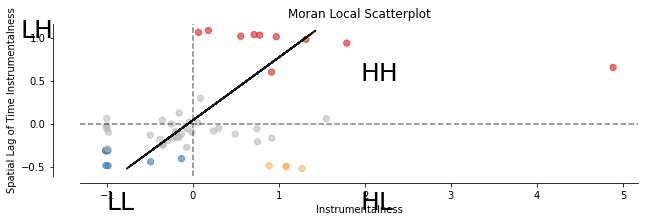

In [216]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Instrumentalness")
ax.set_ylabel('Spatial Lag of Time Instrumentalness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

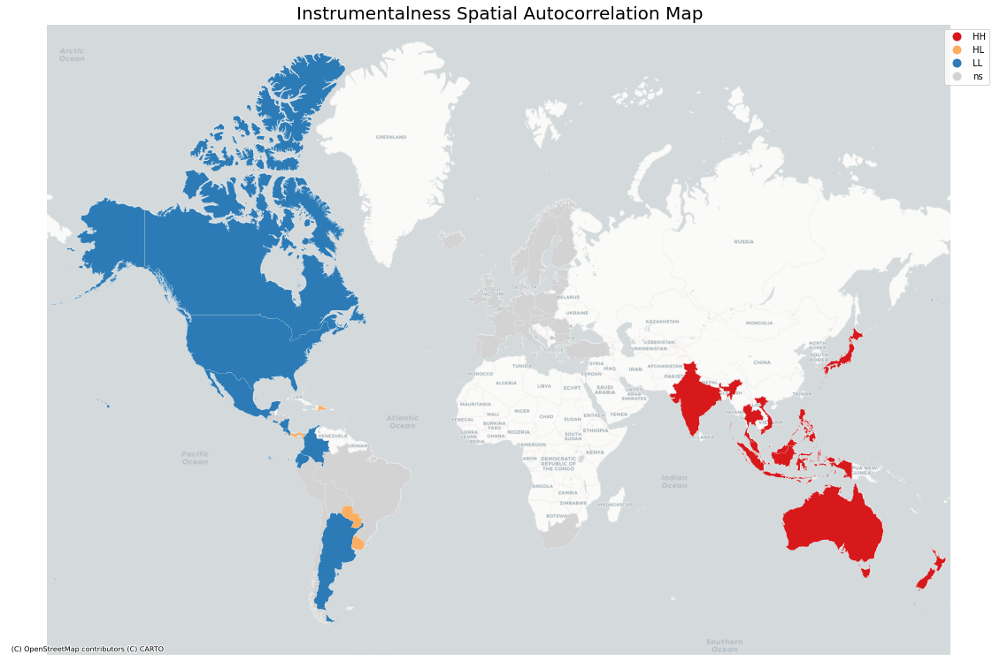

In [217]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Instrumentalness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

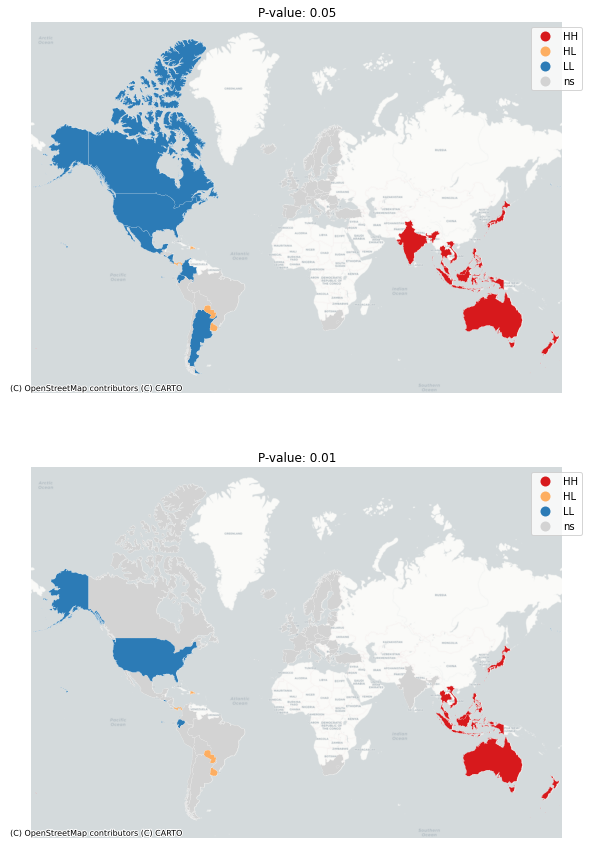

In [218]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Liveness 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [219]:
sdf = mdf[['Country','liveness','geometry']]
sdf.head()

,Country,liveness,geometry
0,Argentina,0.141424,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.202782,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.215382,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.198519,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.148220,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [220]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [221]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [222]:
# create a new column for the spatial lag
sdf['liveness_lag'] = lps.weights.lag_spatial(wq, sdf['liveness'])

In [223]:
sdf.sample(10)

,Country,liveness,geometry,liveness_lag
36,Mexico,0.174114,"MULTIPOLYGON (((-12418803.384 2805825.863, -12...",0.140397
19,Germany,0.185843,"MULTIPOLYGON (((856850.403 6031214.222, 852274...",0.203286
32,Lithuania,0.221085,"MULTIPOLYGON (((2616457.336 7160133.638, 26169...",0.205062
9,Colombia,0.125467,"MULTIPOLYGON (((-8333467.119 1246340.923, -833...",0.141810
18,France,0.216019,"MULTIPOLYGON (((198339.953 5246743.398, 193541...",0.198221
6,Bulgaria,0.229649,"POLYGON ((2553179.327 5062937.070, 2555439.127...",0.214499
24,Iceland,0.236802,"POLYGON ((-2451781.372 9456940.889, -2451750.1...",0.199554
44,Philippines,0.160855,"MULTIPOLYGON (((13346381.206 1781703.566, 1334...",0.178112
8,Chile,0.117109,"MULTIPOLYGON (((-8131009.373 -5424344.646, -81...",0.142635
17,Finland,0.192003,"MULTIPOLYGON (((2562273.131 8422307.547, 25651...",0.201561


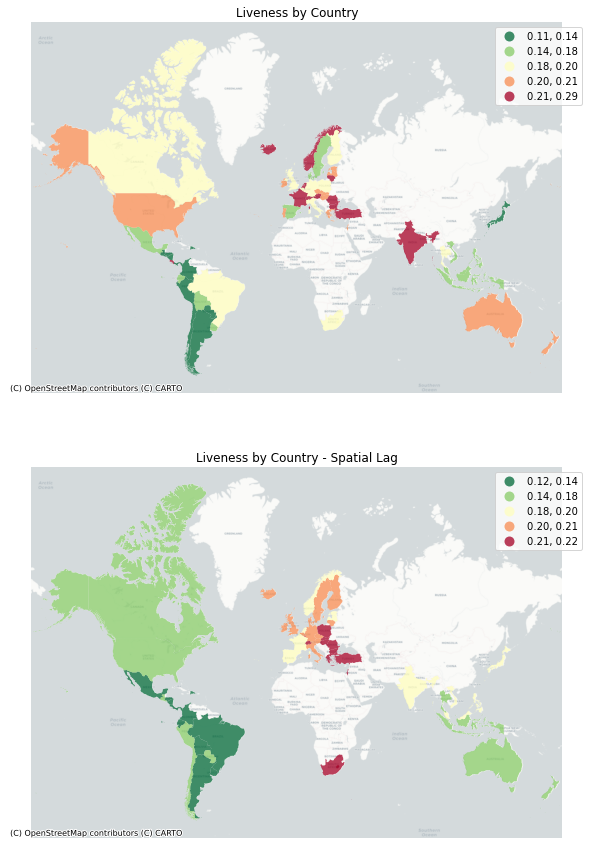

In [224]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='liveness', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Liveness by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='liveness_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Liveness by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [225]:
y = sdf.liveness
moran = Moran(y, wq)
moran.I

0.41919571455994253

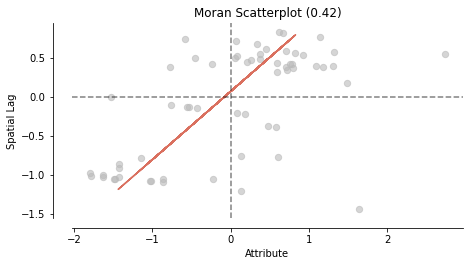

In [226]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b406d670>)

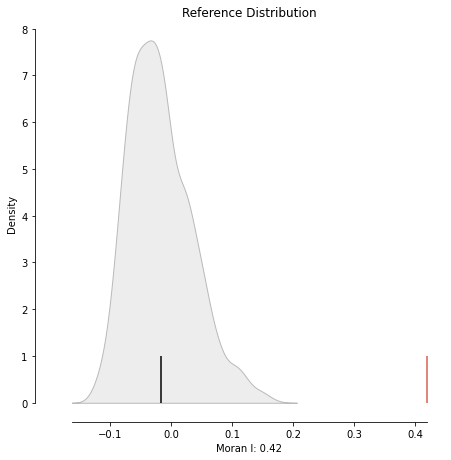

In [227]:
plot_moran_simulation(moran,aspect_equal=False)

In [228]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [229]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

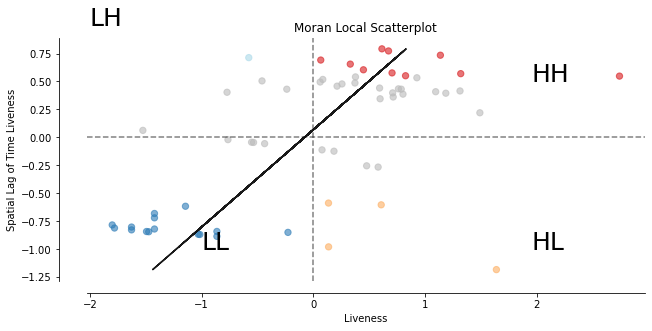

In [230]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Liveness")
ax.set_ylabel('Spatial Lag of Time Liveness')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

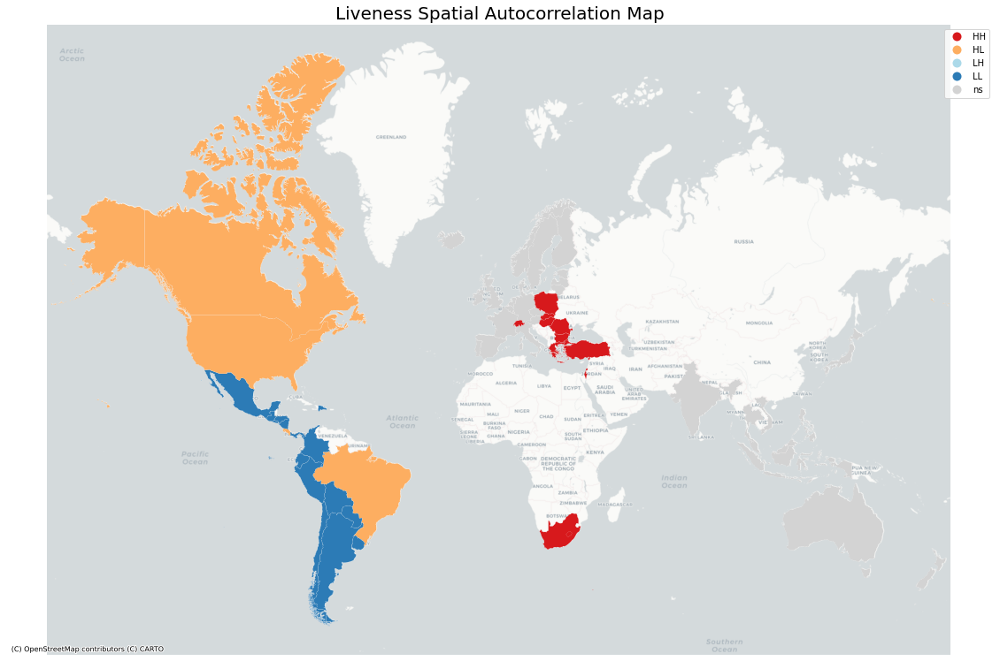

In [231]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Liveness Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

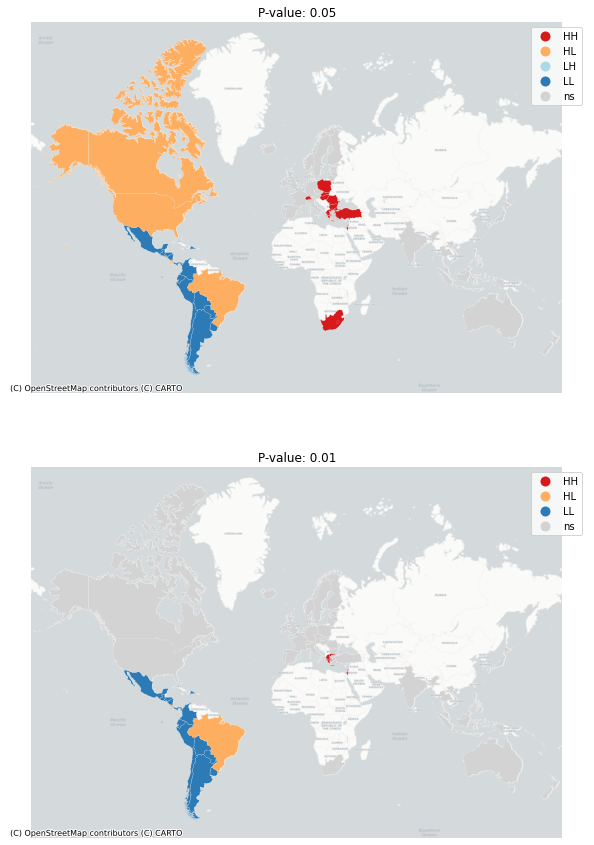

In [232]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: Valence 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and the characteristic. Then, I will reproject the data frame to web mercator for mapping purposes.

In [233]:
sdf = mdf[['Country','valence','geometry']]
sdf.head()

,Country,valence,geometry
0,Argentina,0.501647,"MULTIPOLYGON (((-71.85916 -41.01128, -71.83806..."
1,Australia,0.480185,"MULTIPOLYGON (((151.54025 -24.04584, 151.53137..."
2,Austria,0.486540,"POLYGON ((10.47124 46.87135, 10.48821 46.93599..."
3,Belgium,0.464981,"POLYGON ((4.14924 49.97837, 4.14722 50.00999, ..."
4,Bolivia,0.562100,"POLYGON ((-62.19884 -20.47139, -62.26945 -20.5..."


In [234]:
sdf = sdf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare the characteristic by Country vs. the Spatial Lag by Country.

In [235]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(sdf,k=8)

# Row-standardization
wq.transform = 'r'

In [236]:
# create a new column for the spatial lag
sdf['valence_lag'] = lps.weights.lag_spatial(wq, sdf['valence'])

In [237]:
sdf.sample(10)

,Country,valence,geometry,valence_lag
4,Bolivia,0.562100,"POLYGON ((-6923942.728 -2328958.066, -6931803....",0.537180
58,Uruguay,0.523636,"POLYGON ((-6499821.611 -3951518.978, -6502829....",0.541988
43,Peru,0.565917,"POLYGON ((-7736674.195 -1979723.033, -7751177....",0.529588
8,Chile,0.535727,"MULTIPOLYGON (((-8131009.373 -5424344.646, -81...",0.540477
49,Slovakia,0.465889,"POLYGON ((2115212.060 6118333.999, 2113934.894...",0.507309
41,Panama,0.435500,"MULTIPOLYGON (((-8908508.221 938624.438, -8913...",0.540915
36,Mexico,0.572929,"MULTIPOLYGON (((-12418803.384 2805825.863, -12...",0.529755
39,Nicaragua,0.535727,"POLYGON ((-9254195.765 1688391.367, -9261411.2...",0.528387
53,Switzerland,0.476667,"POLYGON ((717670.648 5915905.222, 719155.329 5...",0.493386
6,Bulgaria,0.500631,"POLYGON ((2553179.327 5062937.070, 2555439.127...",0.457626


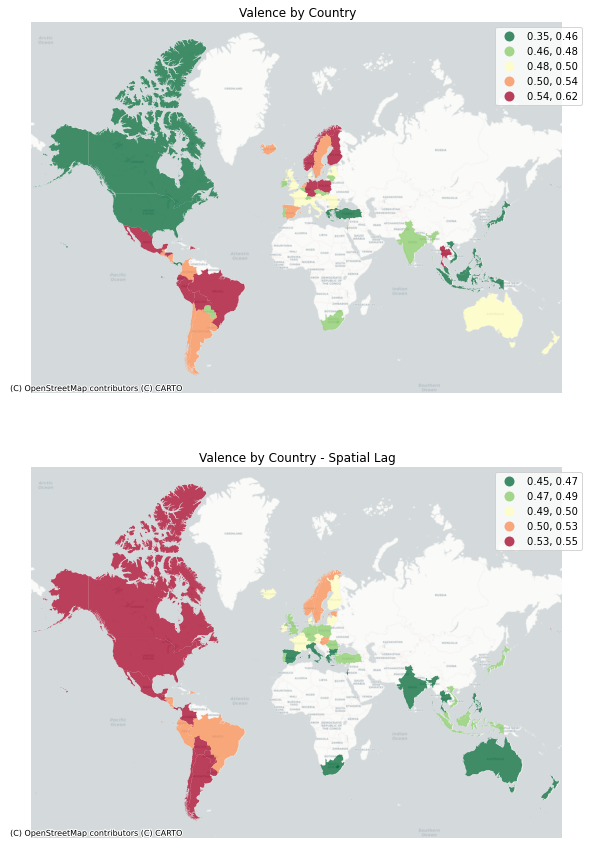

In [238]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map
sdf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='valence', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )


ax[0].axis("off")
ax[0].set_title("Valence by Country")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map
sdf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='valence_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend = 'TRUE'
           )

ax[1].axis("off")
ax[1].set_title("Valence by Country - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the characteristic data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [239]:
y = sdf.valence
moran = Moran(y, wq)
moran.I

0.255189886630228

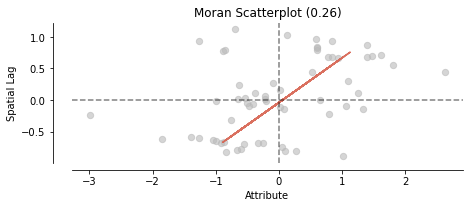

In [240]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43bb0f7eb0>)

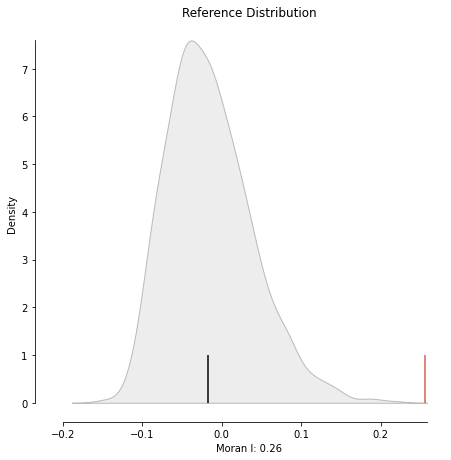

In [241]:
plot_moran_simulation(moran,aspect_equal=False)

In [242]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high characteristic level near other high characteristic level neighbors
- LL: low characteristic level geographies near other low characteristic level neighbors
- LH (donuts): low characteristic level geographies surrounded by high characteristic level neighbors
- HL (diamonds): high characteristic level geographies surrounded by low characteristic level neighbors

In [243]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

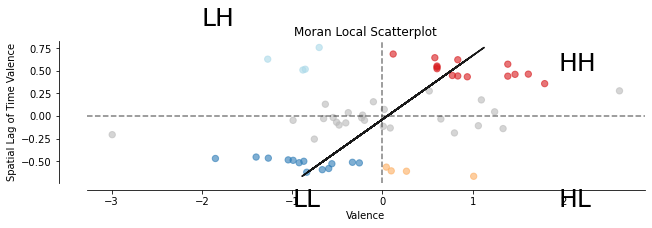

In [244]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("Valence")
ax.set_ylabel('Spatial Lag of Time Valence')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

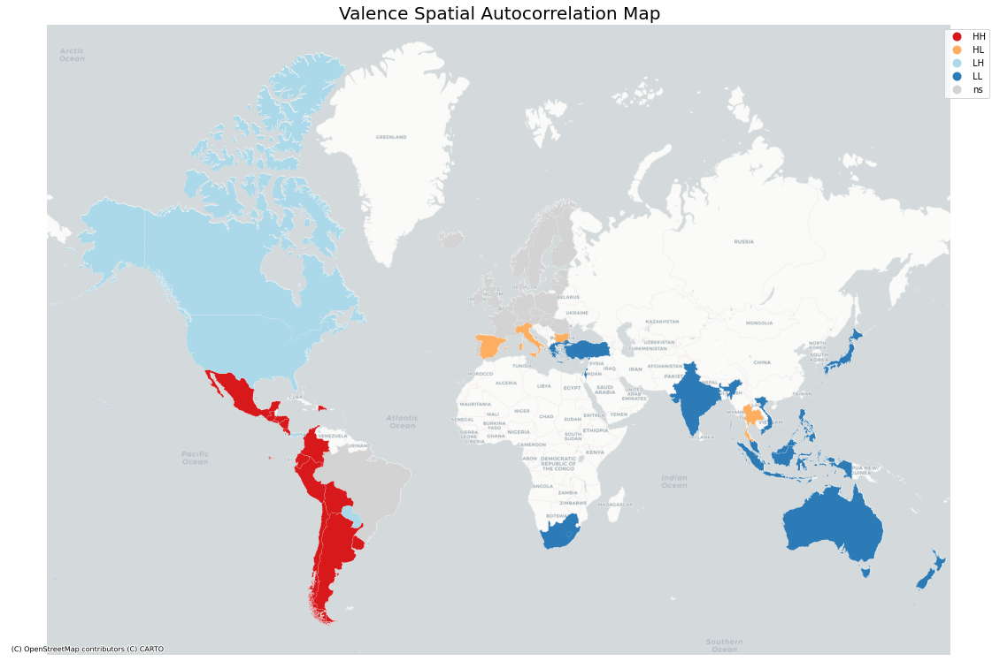

In [245]:
fig, ax = plt.subplots(figsize=(20,20))
lisa_cluster(lisa, sdf, p=0.05, ax=ax)

ax.set_title("Valence Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

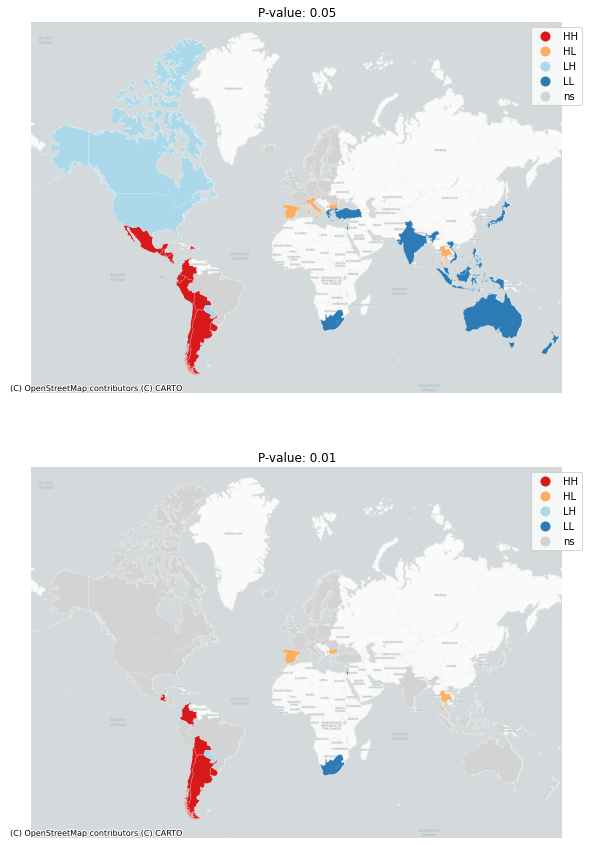

In [246]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# P-value: 0.05
lisa_cluster(lisa, sdf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# P-value: 0.01
lisa_cluster(lisa, sdf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

# GDP Per Capita Analysis
## Spatial Autocorrelation Analysis: GDP per capita 2019
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and GDP per capita. Then, I will reproject the data frame to web mercator for mapping purposes.

In [247]:
edf = gdf[['Country','GDP2019','geometry']]
edf.head()

,Country,GDP2019,geometry
0,Afghanistan,507.29,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,Albania,5323.19,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,Algeria,3898.01,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,Angola,2967.96,"MULTIPOLYGON (((23.47611 -17.62584, 23.28916 -..."
4,Antigua and Barbuda,17195.46,"MULTIPOLYGON (((-61.73806 16.98972, -61.82917 ..."


In [248]:
edf = edf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare GDP per capita by Country vs. the Spatial Lag by Country.

In [249]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(edf,k=8)

# Row-standardization
wq.transform = 'r'

/opt/conda/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [250]:
# create a new column for the spatial lag
edf['GDP2019_lag'] = lps.weights.lag_spatial(wq, edf['GDP2019'])

In [251]:
edf.sample(10)

,Country,GDP2019,geometry,GDP2019_lag
69,Iceland,67857.18,"POLYGON ((-2451781.372 9456940.889, -2451750.1...",65509.227500
146,Suriname,6191.28,"POLYGON ((-6136816.881 649239.641, -6134198.87...",11219.411250
12,Bangladesh,1816.04,"MULTIPOLYGON (((10068761.908 2637293.265, 1007...",3066.060000
156,Tunisia,3292.59,"MULTIPOLYGON (((1150227.923 4423691.616, 11515...",19353.360000
154,Tonga,5150.55,"MULTIPOLYGON (((-19497084.611 -2423871.213, -1...",5449.901250
96,Marshall Islands,4325.68,"MULTIPOLYGON (((18789213.028 813593.103, 18787...",6048.738750
53,Fiji,6043.01,"MULTIPOLYGON (((20037507.067 -1824737.078, 200...",9034.400000
161,Ukraine,3706.77,"POLYGON ((3140861.184 5692430.167, 3140924.988...",11588.782500
34,China,10286.58,"MULTIPOLYGON (((12212148.916 2060710.579, 1220...",3074.510000
51,Eswatini,4113.89,"POLYGON ((3439710.502 -3095008.199, 3437576.29...",2930.844625


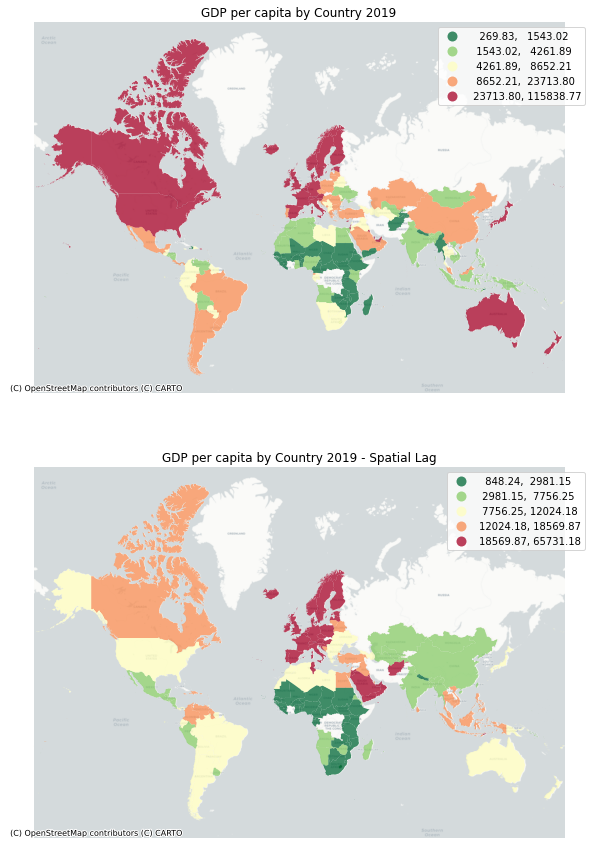

In [252]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
edf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='GDP2019', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend='TRUE'
           )


ax[0].axis("off")
ax[0].set_title("GDP per capita by Country 2019")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map on the right
edf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='GDP2019_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend='TRUE'
           )

ax[1].axis("off")
ax[1].set_title("GDP per capita by Country 2019 - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the GPD per capita data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [253]:
y = edf.GDP2019
moran = Moran(y, wq)
moran.I

0.4971839278826645

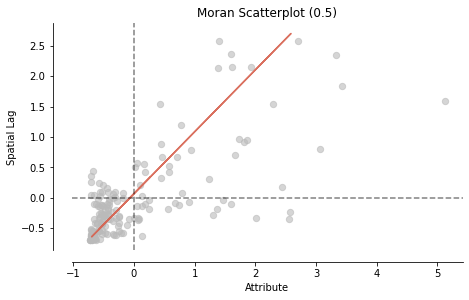

In [254]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43b87e04f0>)

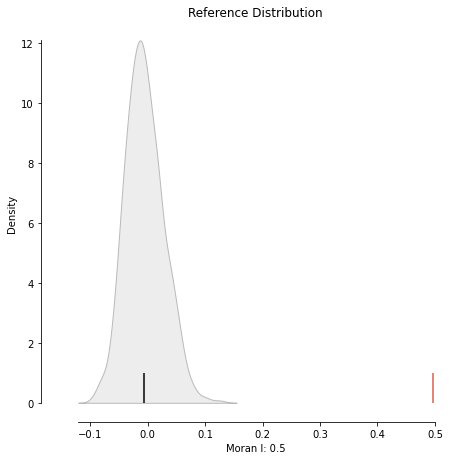

In [255]:
plot_moran_simulation(moran,aspect_equal=False)

In [256]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high GDP per capita near other high GDP per capita neighbors
- LL: low GDP per capital geographies near other low GDP per capita neighbors
- LH (donuts): low GDP per capita geographies surrounded by high GDP per capita neighbors
- HL (diamonds): high GDP per capita geographies surrounded by low GDP per capita neighbors

In [257]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

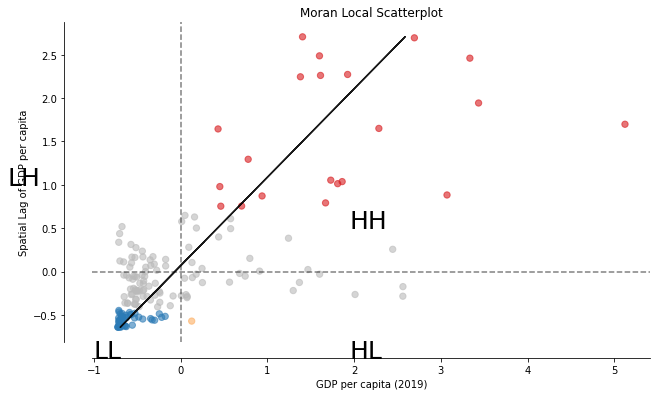

In [258]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("GDP per capita (2019)")
ax.set_ylabel('Spatial Lag of GDP per capita')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

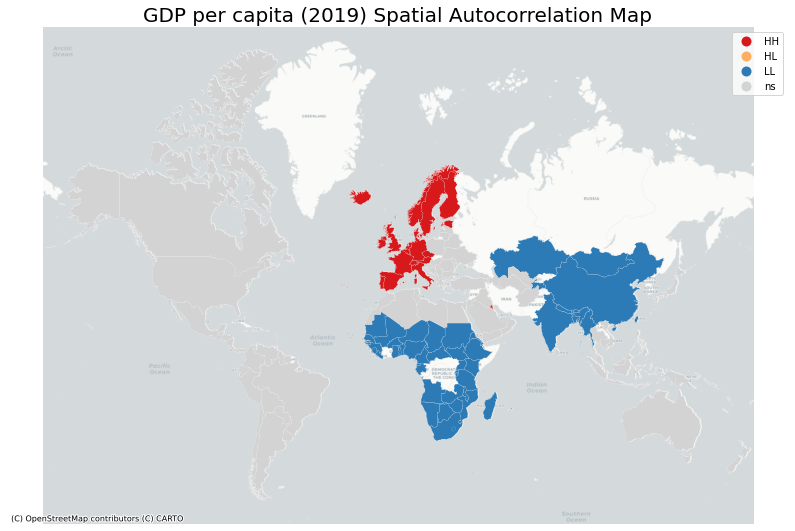

In [259]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, edf, p=0.05, ax=ax)

ax.set_title("GDP per capita (2019) Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

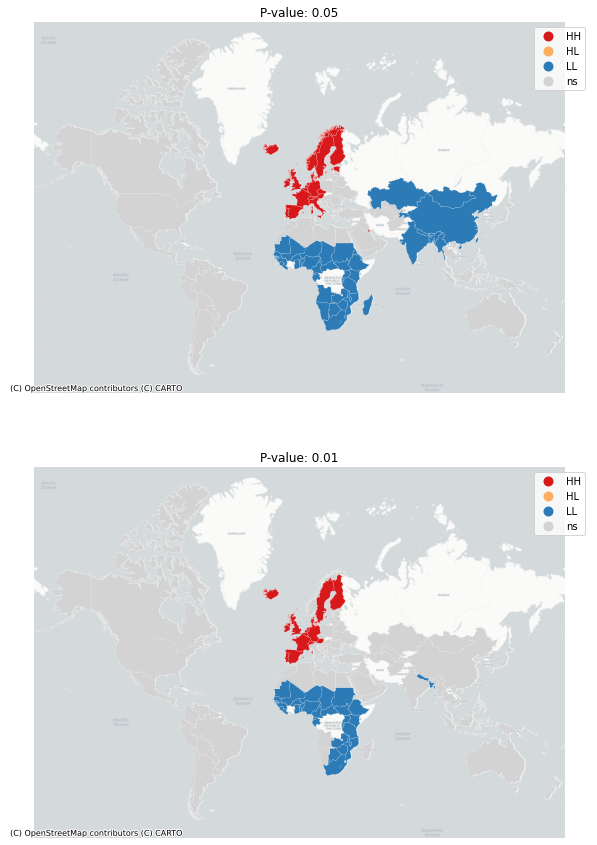

In [260]:
# create the 1x2 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map on the left
lisa_cluster(lisa, edf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map on the right
lisa_cluster(lisa, edf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

## Spatial Autocorrelation Analysis: GDP per capita 2020
### Subsetting the data
First, I will subset the data to only include the Country, geometry coordinates, and GDP per capita. Then, I will reproject the data frame to web mercator for mapping purposes.

In [261]:
edf = gdf[['Country','GDP2020','geometry']]
edf.head()

,Country,GDP2020,geometry
0,Afghanistan,499.441,"POLYGON ((61.27655 35.60725, 61.29638 35.62854..."
1,Albania,4898.280,"POLYGON ((19.57083 41.68527, 19.58195 41.69569..."
2,Algeria,3331.080,"POLYGON ((4.60335 36.88791, 4.63555 36.88638, ..."
3,Angola,2021.310,"MULTIPOLYGON (((23.47611 -17.62584, 23.28916 -..."
4,Antigua and Barbuda,14158.570,"MULTIPOLYGON (((-61.73806 16.98972, -61.82917 ..."


In [262]:
edf = edf.to_crs(epsg=3857)

### Spatial Lag
In this section, I will calculate spatial weight, row standardize them, and create a new column for spatial lag. Then, I will create a 2x1 subplot to compare GDP per capita by Country vs. the Spatial Lag by Country.

In [263]:
# calculate spatial weight
wq =  lps.weights.KNN.from_dataframe(edf,k=8)

# Row-standardization
wq.transform = 'r'

/opt/conda/lib/python3.8/site-packages/libpysal/weights/weights.py:172: UserWarning: The weights matrix is not fully connected: 
 There are 2 disconnected components.
  warnings.warn(message)


In [264]:
# create a new column for the spatial lag
edf['GDP2020_lag'] = lps.weights.lag_spatial(wq, edf['GDP2020'])

In [265]:
edf.sample(10)

,Country,GDP2020,geometry,GDP2020_lag
83,Latvia,17230.140,"POLYGON ((2706731.445 7940440.483, 2707783.835...",24892.080000
87,Libya,3282.040,"POLYGON ((1550678.530 3864288.980, 1553153.813...",7341.866875
112,Nicaragua,1832.500,"POLYGON ((-9254195.765 1688391.367, -9261411.2...",5734.970750
131,Samoa,4083.810,"MULTIPOLYGON (((-19213354.485 -1517957.276, -1...",11498.687500
64,Guinea-Bissau,766.749,"MULTIPOLYGON (((-1745675.846 1322712.622, -175...",1308.034125
84,Lebanon,2744.760,"POLYGON ((4004470.806 4116080.396, 4010933.337...",14281.900000
13,Barbados,16082.470,"POLYGON ((-6627189.363 1465508.537, -6628565.6...",11573.620000
95,Malta,28468.650,"POLYGON ((1616327.636 4273136.488, 1605660.229...",14492.053750
36,Comoros,1336.950,"MULTIPOLYGON (((4837233.645 -1338438.059, 4834...",2349.451500
66,Haiti,732.066,"MULTIPOLYGON (((-8138691.406 2228889.408, -814...",13608.893750


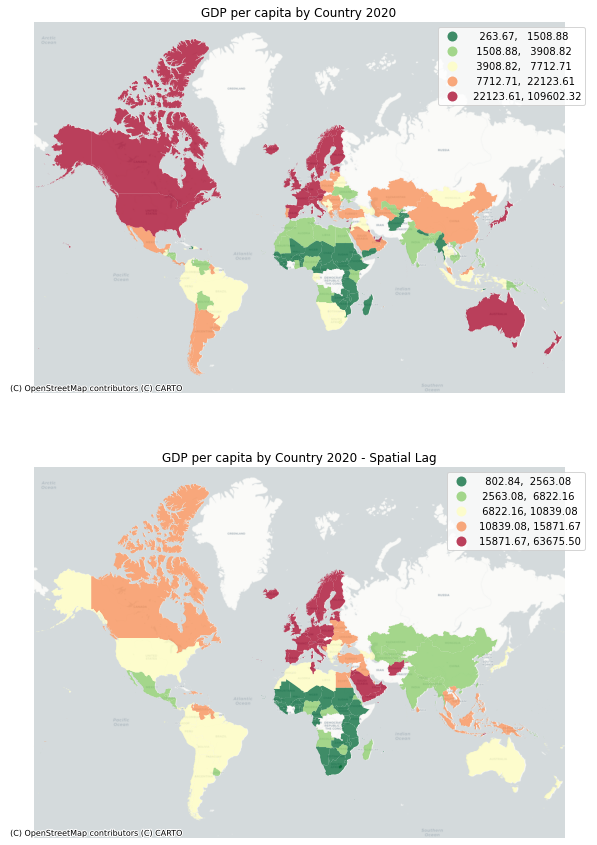

In [266]:
# create the 2x1 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
edf.plot(ax=ax[0], # this assigns the map to the left subplot
         column='GDP2020', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend='TRUE'
           )


ax[0].axis("off")
ax[0].set_title("GDP per capita by Country 2020")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map on the right
edf.plot(ax=ax[1], # this assigns the map to the right subplot
         column='GDP2020_lag', 
         cmap='RdYlGn_r', 
         scheme='quantiles',
         k=5, 
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75,
         legend='TRUE'
           )

ax[1].axis("off")
ax[1].set_title("GDP per capita by Country 2020 - Spatial Lag")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

### Moran's Plot
In this section, I will start quantifying the level of spatial correlation present in the data. To start, I will calculate Moran's I value for the GPD per capita data. The value represents the slope of the Moran scatterplot. Afterwards, I will run a simulation of 999 permutations that randomly shuffles the data throughout the given countries. Then, I will create a sampling distribution of Moran’s I values under the (null) hypothesis that attribute values are randomly distributed across the study area. Based on the distribution, our data will have statistically signicant spatial correlation if its p-value is less than 0.05.

In [267]:
y = edf.GDP2020
moran = Moran(y, wq)
moran.I

0.5119636327369138

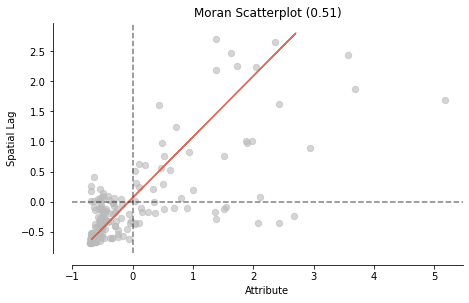

In [268]:
fig, ax = moran_scatterplot(moran, aspect_equal=True)
plt.show()

/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:47: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['left'].set_smart_bounds(True)
/opt/conda/lib/python3.8/site-packages/splot/_viz_esda_mpl.py:48: MatplotlibDeprecationWarning: 
The set_smart_bounds function was deprecated in Matplotlib 3.2 and will be removed two minor releases later.
  ax.spines['bottom'].set_smart_bounds(True)


(<Figure size 504x504 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f43bb526250>)

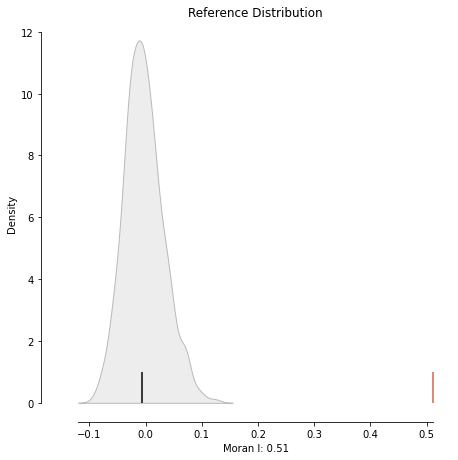

In [269]:
plot_moran_simulation(moran,aspect_equal=False)

In [270]:
moran.p_sim

0.001

### Local Analysis
Now that it is confirmed that our data is significant, I want to know more about where the clusters are. To do this, I will use the method, Local Indicators of Spatial Association (LISA), to calculate local moran values. As a reminder, here are the four classified groups:

- HH: high GDP per capita near other high GDP per capita neighbors
- LL: low GDP per capital geographies near other low GDP per capita neighbors
- LH (donuts): low GDP per capita geographies surrounded by high GDP per capita neighbors
- HL (diamonds): high GDP per capita geographies surrounded by low GDP per capita neighbors

In [271]:
# calculate local moran values
lisa = esda.moran.Moran_Local(y, wq)

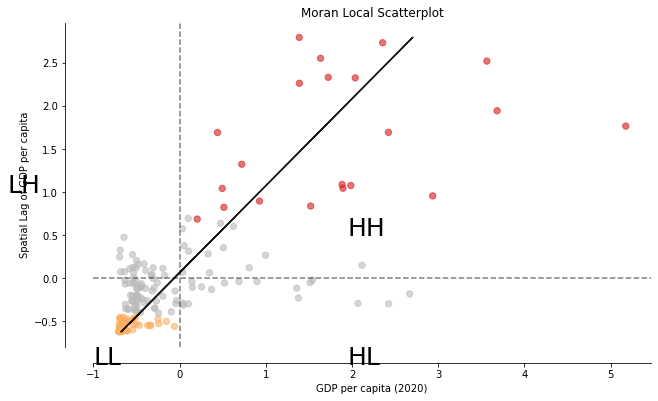

In [272]:
# Plot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa, ax=ax, p=0.05)
ax.set_xlabel("GDP per capita (2020)")
ax.set_ylabel('Spatial Lag of GDP per capita')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

### Spatial Autocorrelation Map
Finally, I will visualize the statistically clusters with maps. The first is a spatial autocorrelation map that shows the countries with p-value less than 0.05. The second 2x1 subplot map compares the countries with p-value less than 0.05 and those with less than 0.01.

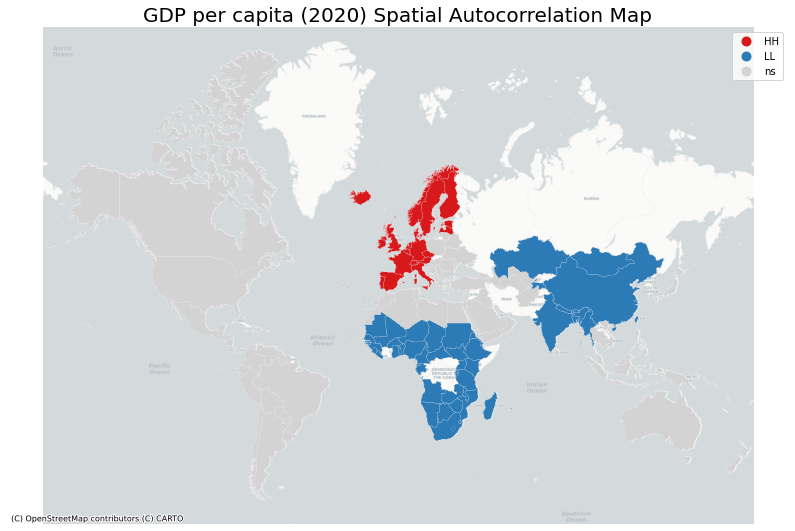

In [273]:
fig, ax = plt.subplots(figsize=(14,12))
lisa_cluster(lisa, edf, p=0.05, ax=ax)

ax.set_title("GDP per capita (2020) Spatial Autocorrelation Map", fontsize =20)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()

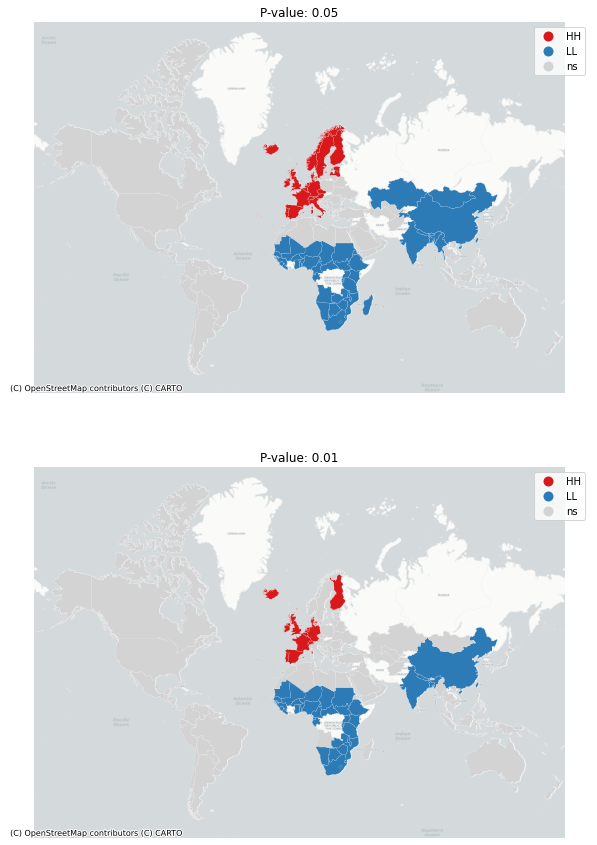

In [274]:
# create the 1x2 subplots
fig, ax = plt.subplots(2,1, figsize=(20, 15))

# regular count map on the left
lisa_cluster(lisa, edf, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

ctx.add_basemap(ax[0],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

# spatial lag map on the right
lisa_cluster(lisa, edf, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

ctx.add_basemap(ax[1],source=ctx.providers.CartoDB.Positron,crs='epsg:3857')

plt.show()